# Exercise Sheet 6: Autoencoder

In [1]:
import torch
import torch.nn as nn

# Load FashionMNIST dataset
from torchvision import datasets, transforms

import os
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import random
import time

# import own module 
from network import Autoencoder, ConvAutoencoder, add_white_noise, to_img

# set figure size
plt.figure(figsize=(5, 4))

plt.rcParams['figure.dpi'] = 150
plt.rcParams['axes.titlesize'] = 8
plt.rcParams['axes.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6

<Figure size 500x400 with 0 Axes>

In [2]:
# set random seed
random.seed(42)
torch.manual_seed(42)

# set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

##### HOUSEKEEPING #####
# set hyperparameters
BATCH_SIZE = 128
EPOCHS = 50
LEARNING_RATE = 1e-3

# set directories
RESULTS_DIR = 'results/'
DATA_DIR = 'data/'
MODEL_DIR = 'models/'

########################

# if don't exist, create directories
if not os.path.exists(RESULTS_DIR):
    os.makedirs(RESULTS_DIR)

if not os.path.exists(DATA_DIR):
    os.makedirs(DATA_DIR)

if not os.path.exists(MODEL_DIR):
    os.makedirs(MODEL_DIR)

In [3]:

# Load FashionMNIST dataset
# Define a transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])

# Download and load the training data
trainset = datasets.FashionMNIST(DATA_DIR, download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True)

# Download and load the test data
testset = datasets.FashionMNIST(DATA_DIR, download=True, train=False, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH_SIZE, shuffle=True)


### Task 1: Implement a Linear Autoencoder 

In [4]:
# 1.1 Implement a fully-connected autoencoder using the class torch.nn.Module2 from pytorch. Use the provided starter code as a template

autoencoder = Autoencoder().to(device)
print(autoencoder)

Autoencoder(
  (encoder): Encoder(
    (encoder): Sequential(
      (0): Linear(in_features=784, out_features=128, bias=True)
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
      (2): Linear(in_features=128, out_features=64, bias=True)
      (3): LeakyReLU(negative_slope=0.01, inplace=True)
      (4): Linear(in_features=64, out_features=32, bias=True)
      (5): LeakyReLU(negative_slope=0.01, inplace=True)
      (6): Linear(in_features=32, out_features=16, bias=True)
      (7): LeakyReLU(negative_slope=0.01, inplace=True)
      (8): Linear(in_features=16, out_features=8, bias=True)
      (9): LeakyReLU(negative_slope=True)
    )
  )
  (decoder): Decoder(
    (decoder): Sequential(
      (0): Linear(in_features=8, out_features=16, bias=True)
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
      (2): Linear(in_features=16, out_features=32, bias=True)
      (3): LeakyReLU(negative_slope=0.01, inplace=True)
      (4): Linear(in_features=32, out_features=64, bias=True)
    

In [5]:
def plot_samples(samples, path='img.png'):
    """ Plot 10 samples with their reconstructions """
    fig, axes = plt.subplots(2, len(samples), figsize=(20, 4))
    axes = axes.flatten()
    fig.suptitle('Input Samples and their Reconstructions')

    for i, (input_img, reconstructed_img) in enumerate(samples):
        # Plot the input image
        axes[i].imshow(input_img.numpy().squeeze(), cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(f'Input Image {i+1}')

        # Plot the reconstructed image
        axes[i+len(samples)].imshow(reconstructed_img.numpy().squeeze(), cmap='gray')
        axes[i+len(samples)].axis('off')
        axes[i+len(samples)].set_title(f'Reconstructed Image {i+1}')

    plt.savefig(path)
    plt.show()

In [6]:
# 1.2 Use the mean squared error3 to implement the reconstruction error of the autoencoder.
def train(model, train_loader, optimizer, criterion, noise=False, device='cpu'):
    model.train()
    running_loss = 0.0

    for i, data in enumerate(train_loader):
        inputs, _ = data
        inputs = inputs.to(device)

        # add noise to the inputs
        if noise:
            inputs_noise = add_white_noise(inputs, factor=0.5, stddev=1)
            inputs_noise = torch.clamp(inputs_noise, -1, 1)

        # zero the parameter gradients
        optimizer.zero_grad()
        outputs = model(inputs_noise if noise else inputs)

        # calculate loss
        loss = criterion(outputs, inputs)
        loss.backward()
        
        # update weights
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        
    return running_loss / len(train_loader)

In [7]:
criterion = nn.MSELoss() # MSE loss

In [8]:
# 1.3 For training use Adam as optimizer with a learning rate of 0.001, weight decay of 1e −5 and a batch size of 128. 
# -- Run it for at least 50 epochs.

lr = 0.001
weight_decay = 1e-5
epochs = 10 # 50 TODO

# create optimizer
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=lr, weight_decay=weight_decay) # Adam optimizer

# store train/test losses
train_losses = []
test_losses = []

# train the model
for epoch in range(epochs):
    start = time.time()
    train_loss = train(autoencoder, trainloader, optimizer, criterion, device=device)
    train_losses.append(train_loss)
    print(f'Epoch {epoch+1}/{epochs}, Loss: {train_loss:.4f}, Time: {time.time()-start:.2f} sec')


Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])


/Users/janinaalicamattes/miniforge3/envs/pytorch-py11/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([128, 1, 28, 28])) that is different to the input size (torch.Size([128, 28, 28])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Inpu

/Users/janinaalicamattes/miniforge3/envs/pytorch-py11/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([96, 1, 28, 28])) that is different to the input size (torch.Size([96, 28, 28])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Inpu

In [9]:
def plot_latent(autoencoder, data, num_batches=64, path='latent.png'):
    # plot latent space as scatter plot
    for i, (x, y) in enumerate(data):
        z = autoencoder.encoder(x.to(device))
        z = z.to('cpu').detach().numpy()
        plt.scatter(z[:, 0], z[:, 1], c=y, cmap='tab10')
        if i > num_batches:
            plt.colorbar()
            break
    # show plot
    plt.xlabel('z1')
    plt.ylabel('z2')
    plt.title('Latent Space')
    plt.savefig(path)
    plt.show()

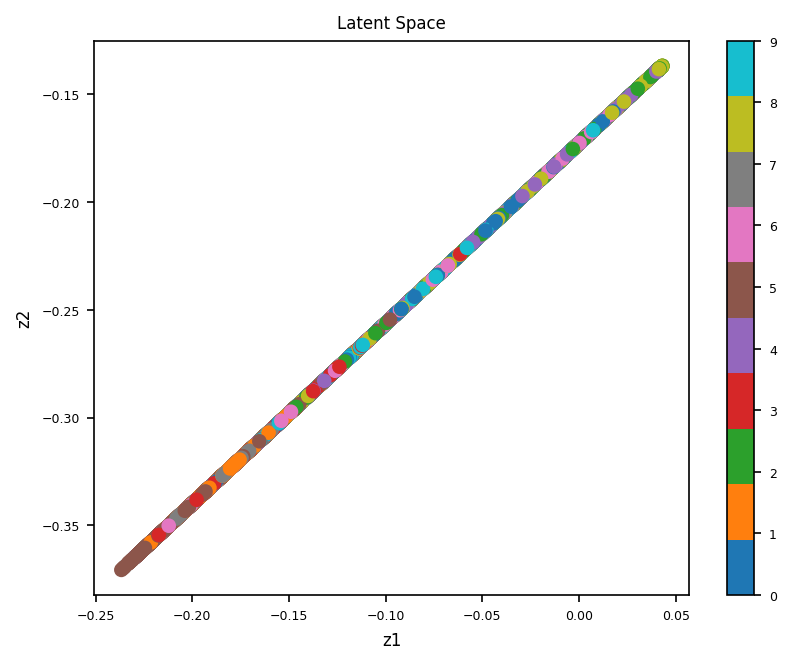

In [10]:
# Plot the latent space
plot_latent(autoencoder, trainloader, num_batches=BATCH_SIZE, path=f'{RESULTS_DIR}ae_latent.png')

In [11]:
# Report the training and validation loss of the autoencoder every ten epochs.
def plot_loss(train_losses, test_losses, label='Loss curve', path='img.png'):
    """ Plot test and training loss into the same plot """
    
    plt.plot(train_losses, label='Training loss')
    plt.plot(test_losses, label='Test loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(label)
    plt.legend()
    plt.savefig(path)
    plt.show()

In [12]:
# 1.4 During the computation of the testing loss plot ten input samples as well as their reconstructions produced by the autoencoder

def test(model, test_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    samples = [] 

    with torch.no_grad():
        for i, data in enumerate(test_loader):
            inputs, _ = data
            inputs = inputs.to(device)

            # forward pass
            outputs = model(inputs)

            # calculate loss
            loss = criterion(outputs, inputs)
            running_loss += loss.item()

            # store the first image from each batch
            inputs = inputs[0].view(1, 1, 28, 28)
            outputs = outputs[0].view(1, 1, 28, 28)
            inputs = to_img(inputs)
            outputs = to_img(outputs)
            samples.append((inputs.cpu(), outputs.cpu()))

            # every 10 batches plot input samples + reconstructions
            if (i+1) % 10 == 0:
                # plot samples
                plot_samples(samples, path=f'{RESULTS_DIR}ae_ten_samples_{i}.png')
                samples = []

    return running_loss / len(test_loader)

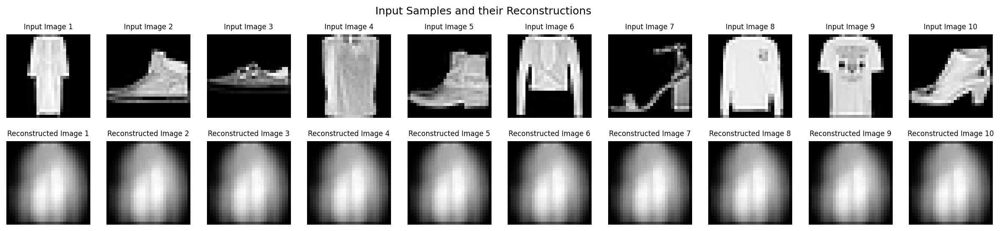

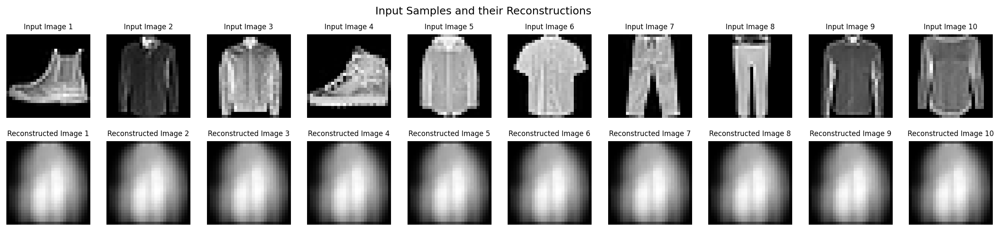

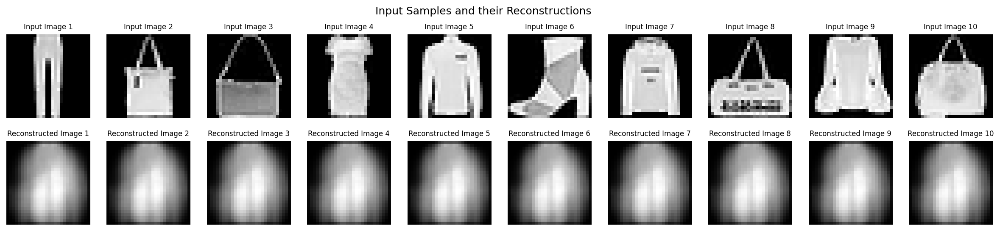

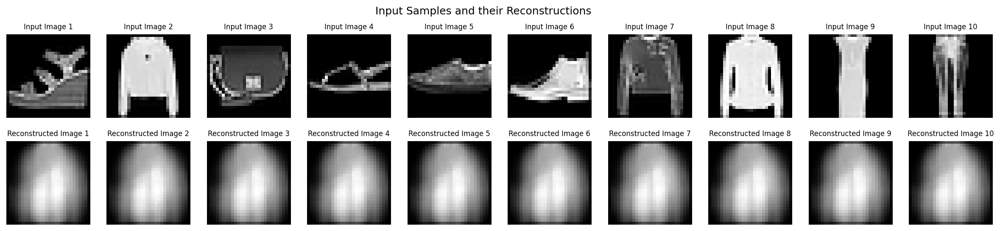

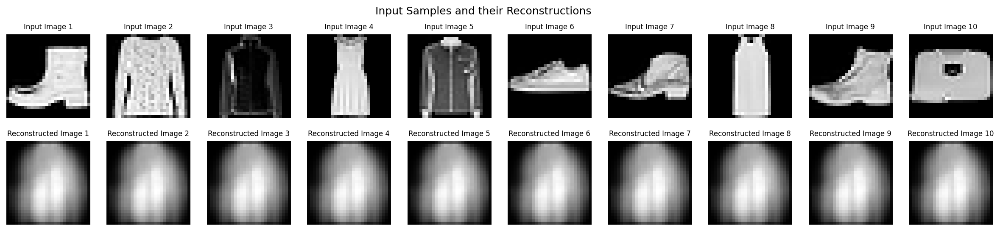

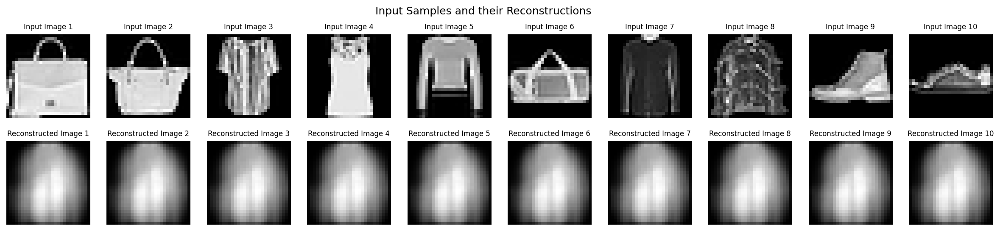

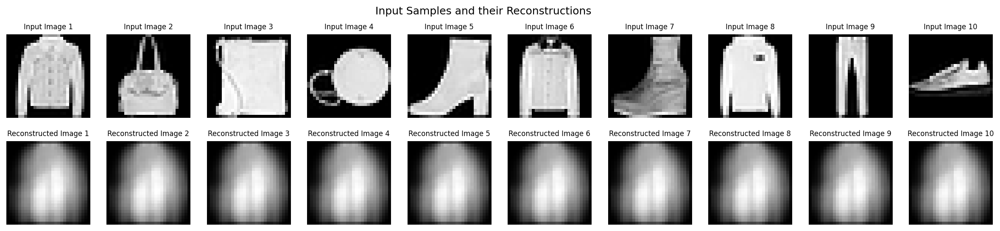

/Users/janinaalicamattes/miniforge3/envs/pytorch-py11/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([16, 1, 28, 28])) that is different to the input size (torch.Size([16, 28, 28])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch 1/10, Loss: 0.3472


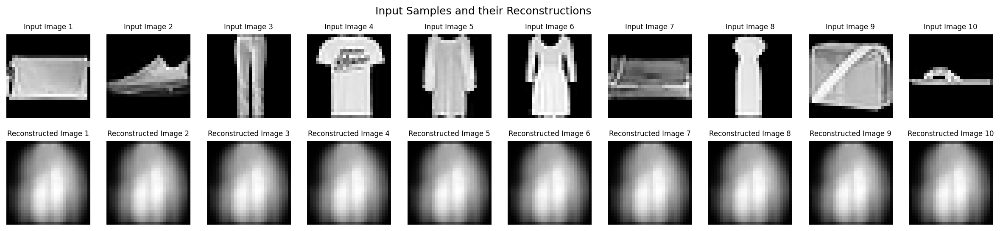

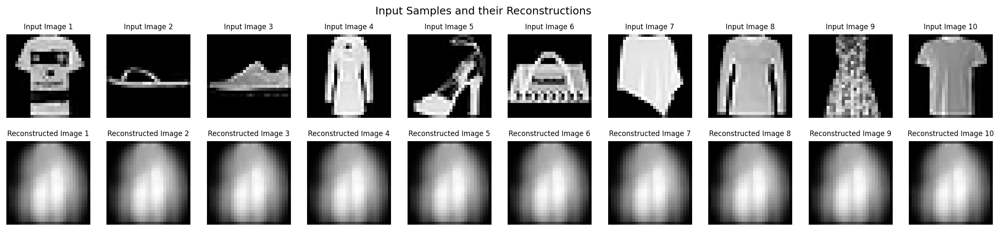

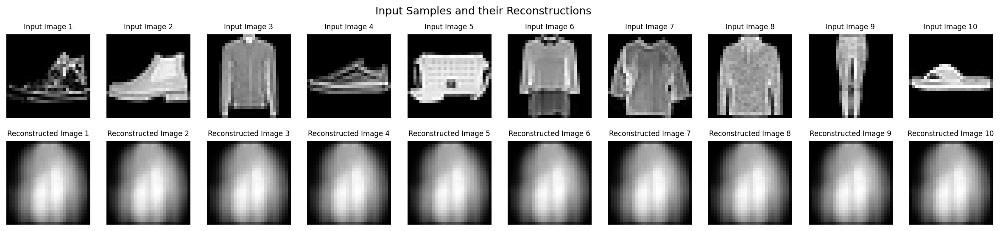

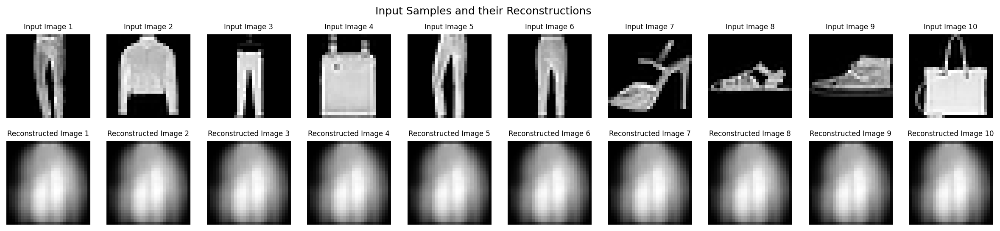

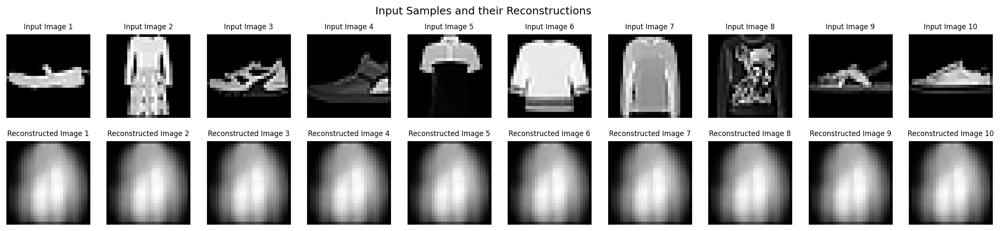

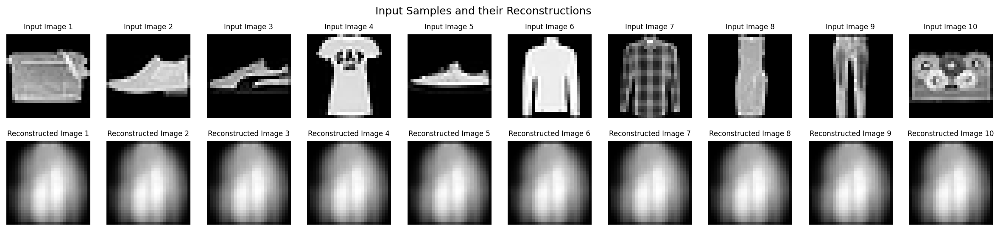

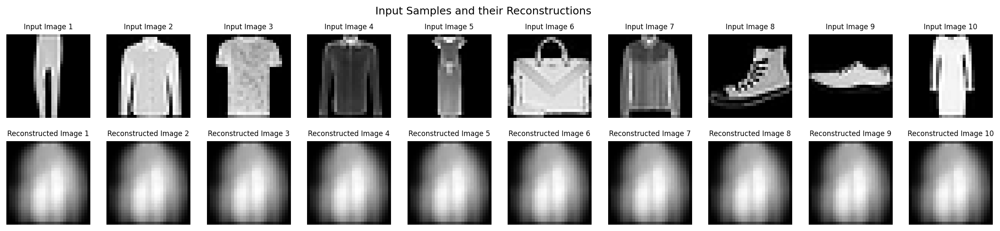

Epoch 2/10, Loss: 0.3469


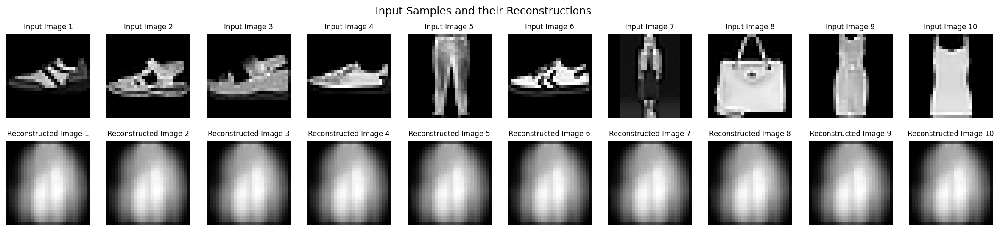

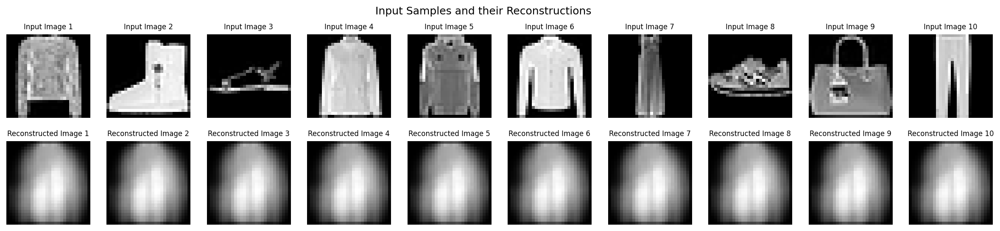

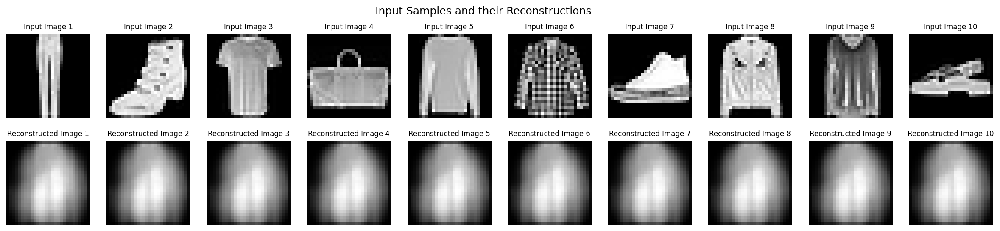

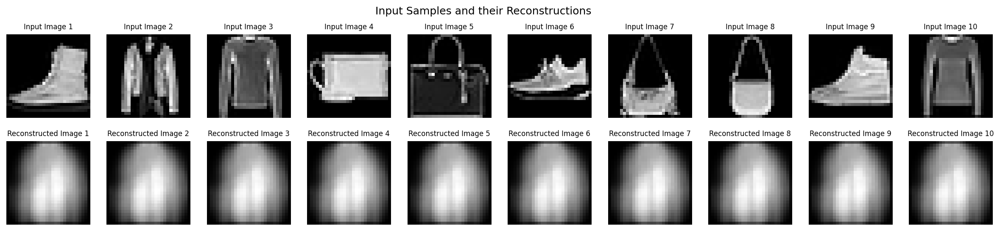

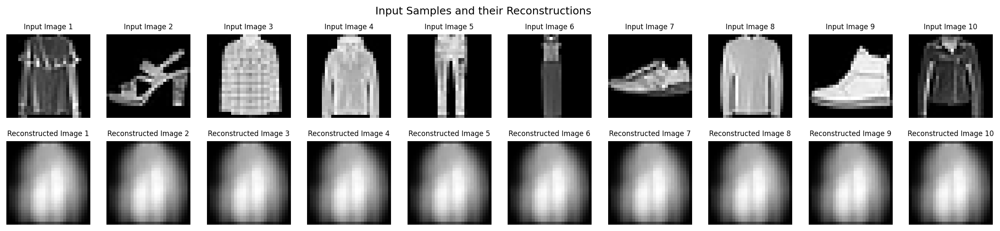

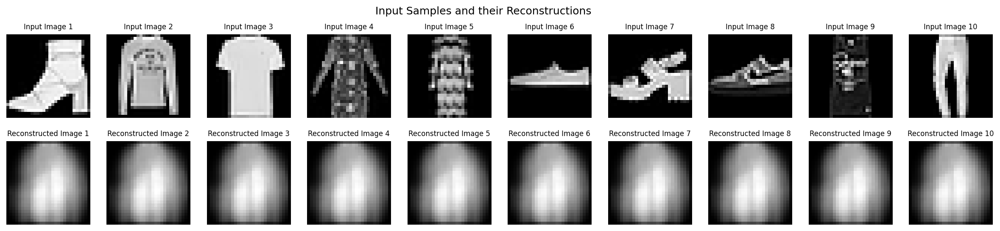

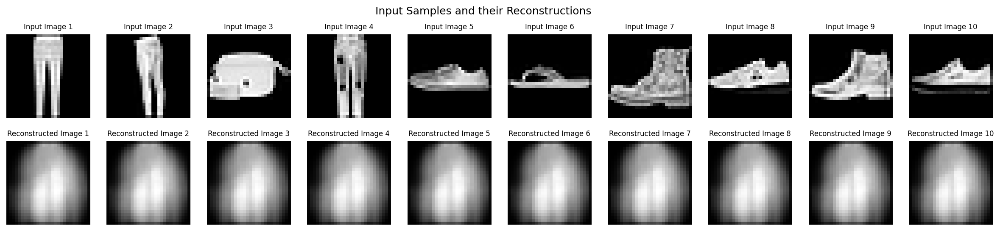

Epoch 3/10, Loss: 0.3466


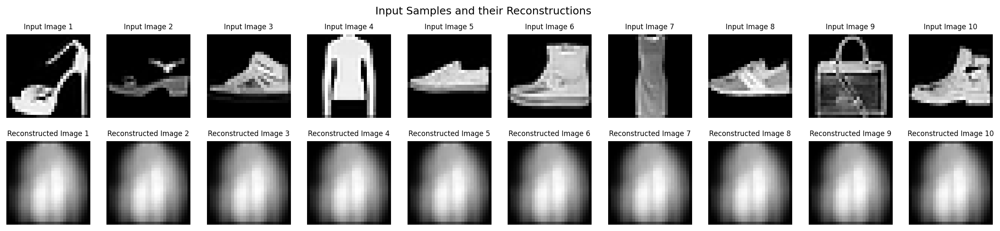

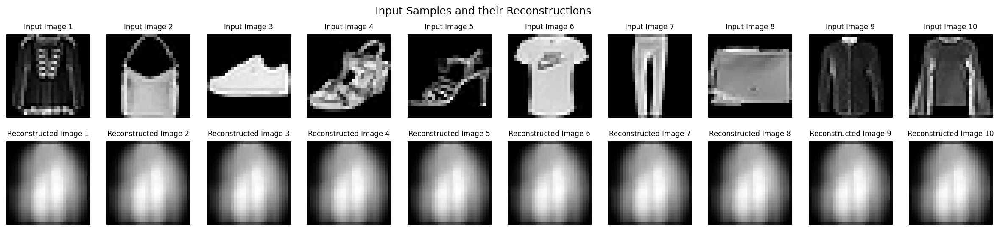

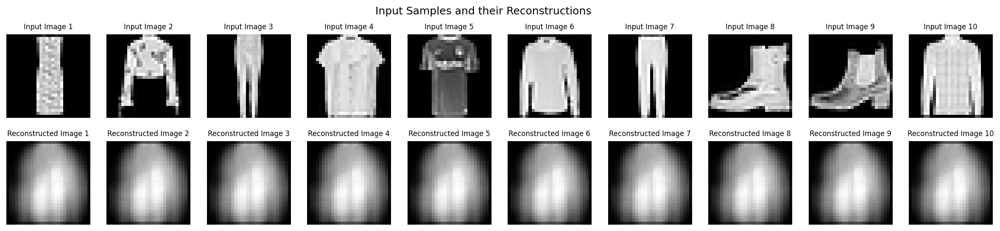

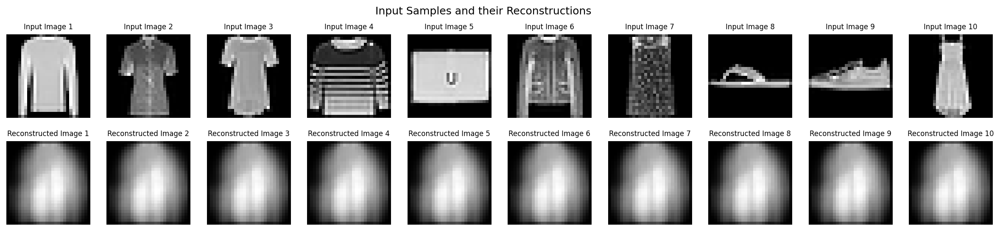

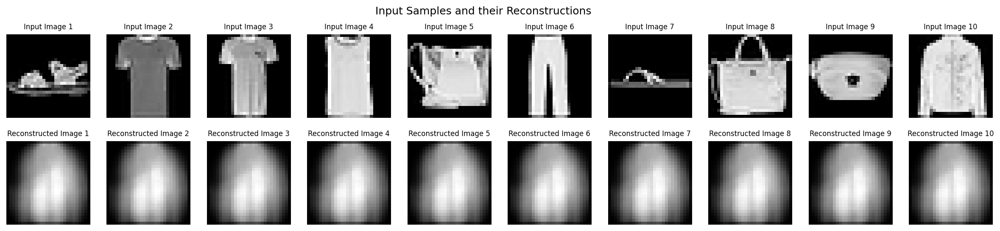

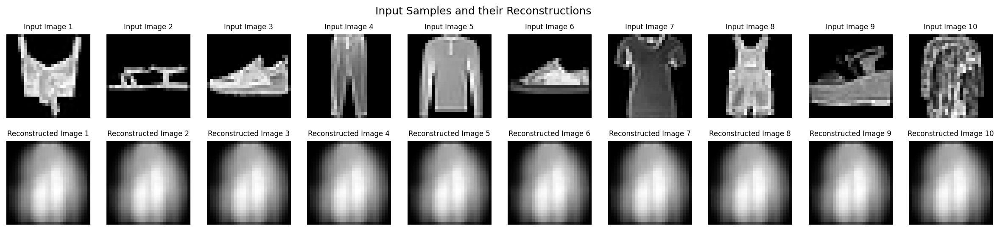

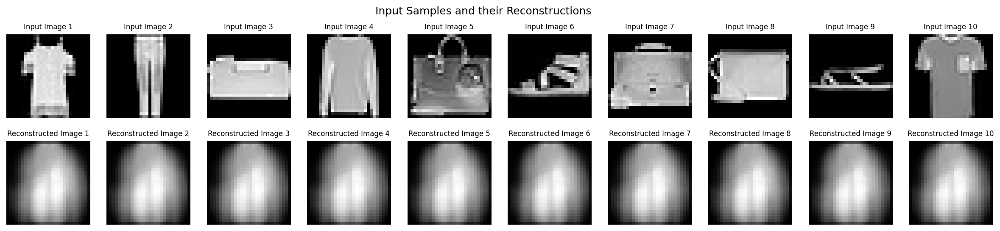

Epoch 4/10, Loss: 0.3472


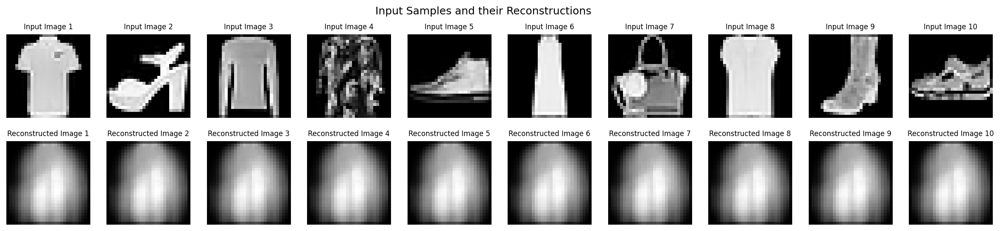

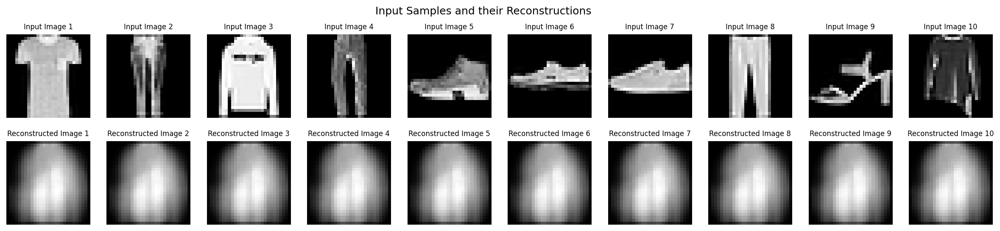

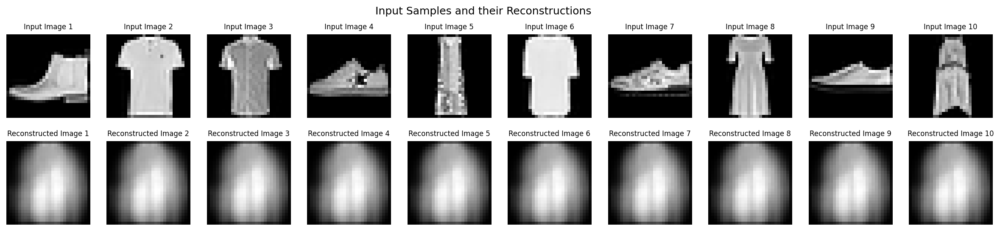

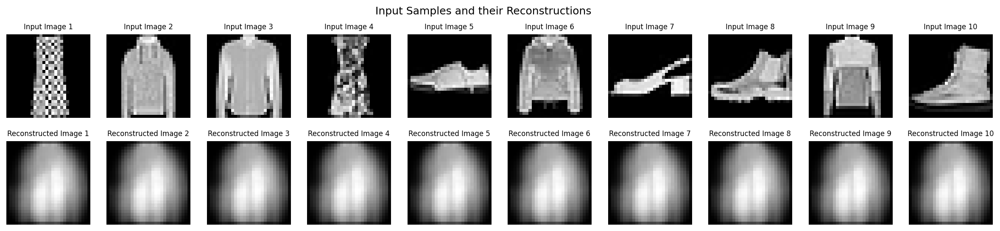

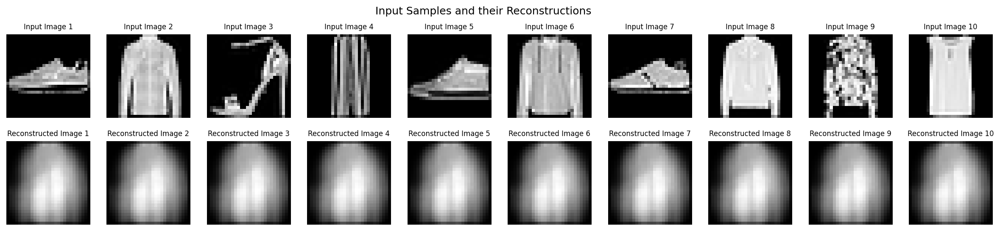

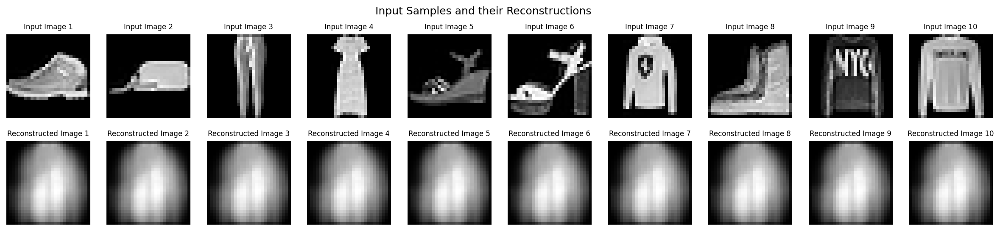

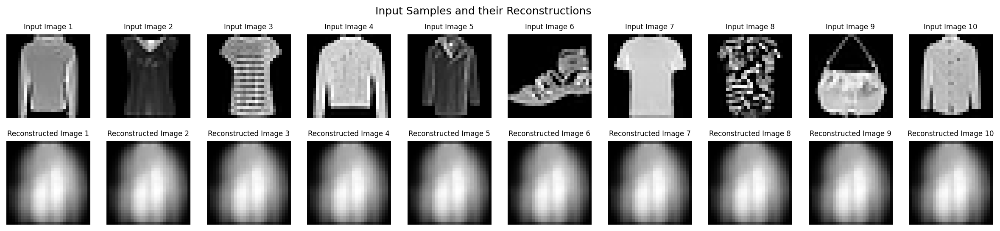

Epoch 5/10, Loss: 0.3475


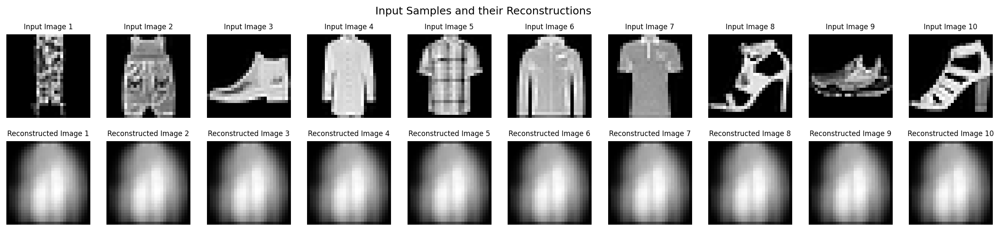

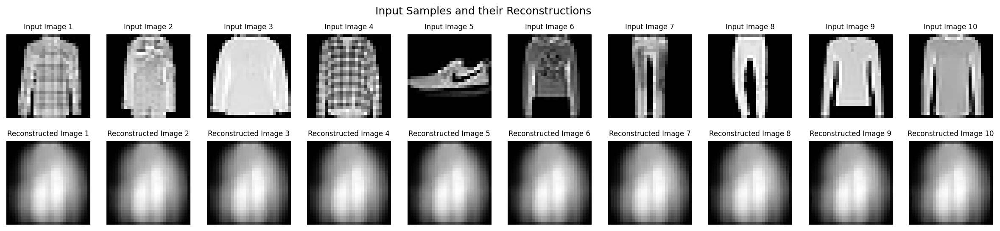

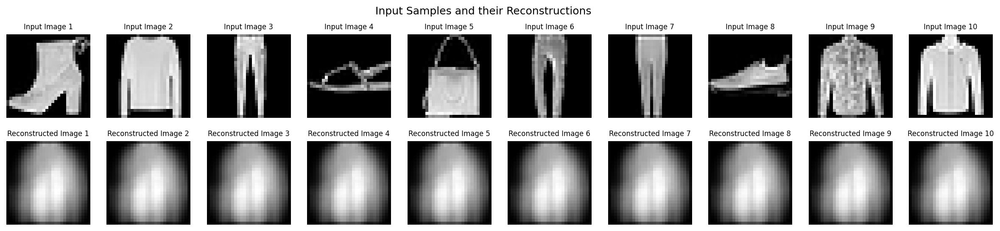

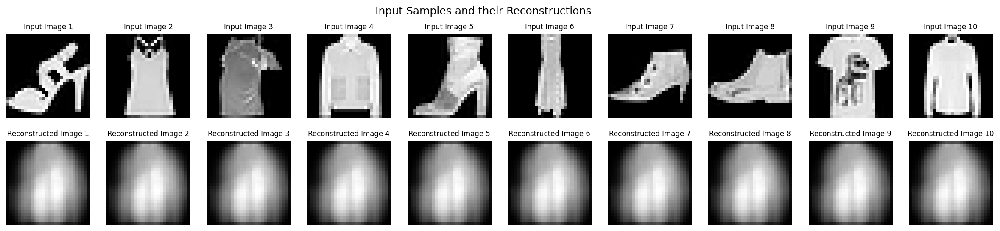

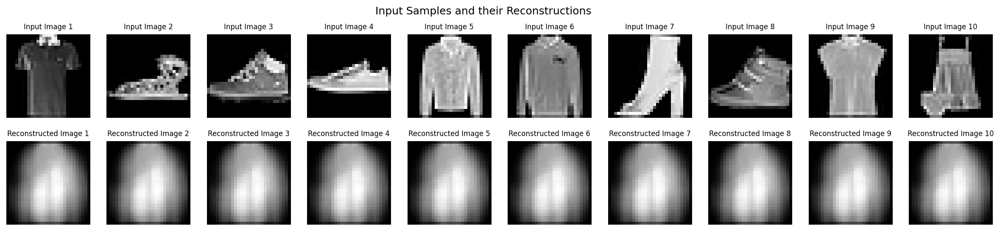

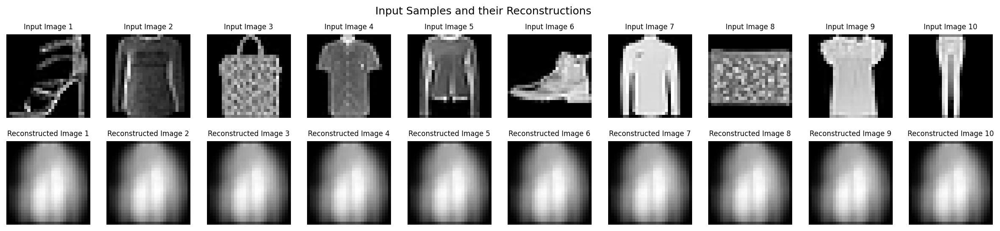

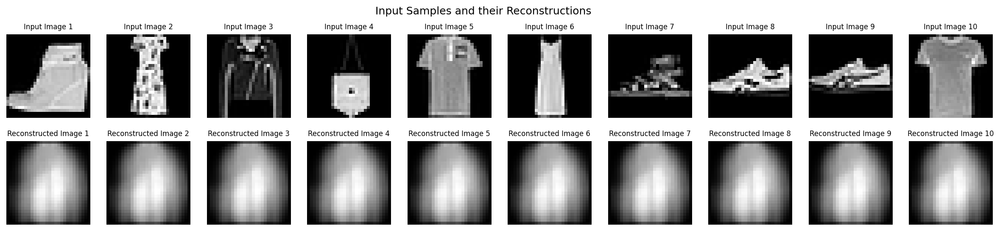

Epoch 6/10, Loss: 0.3468


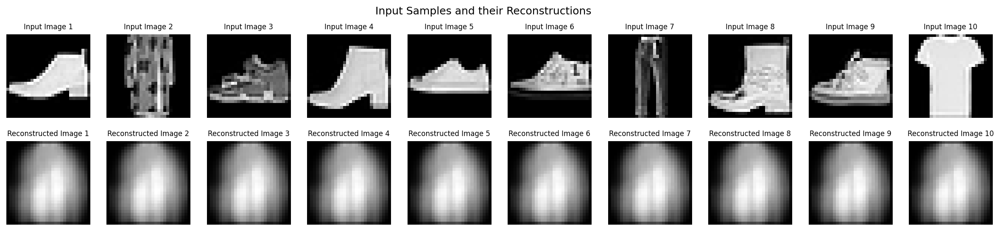

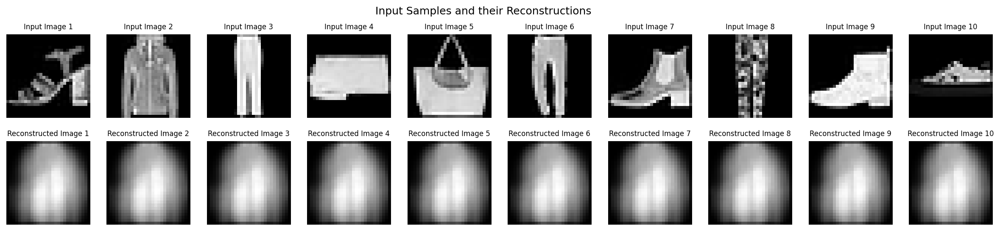

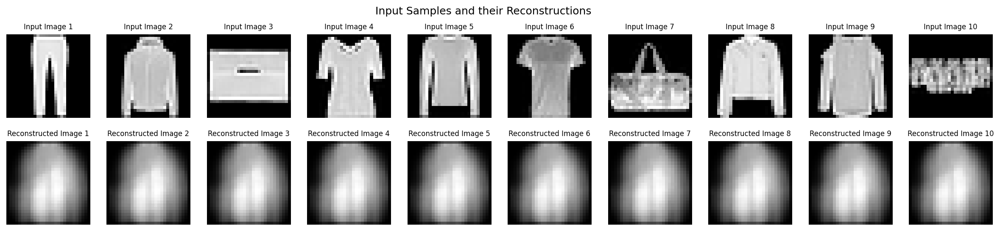

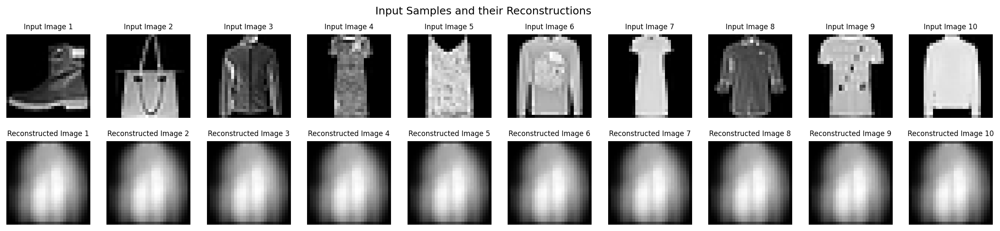

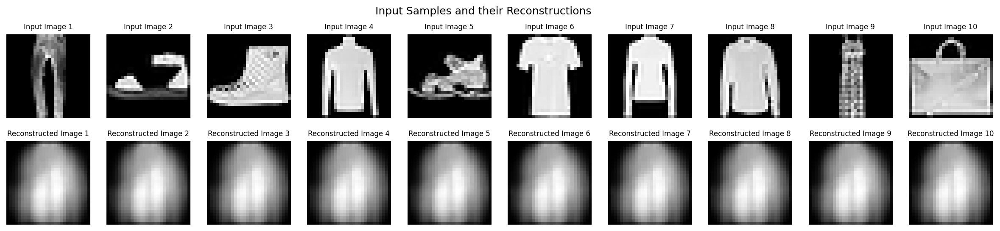

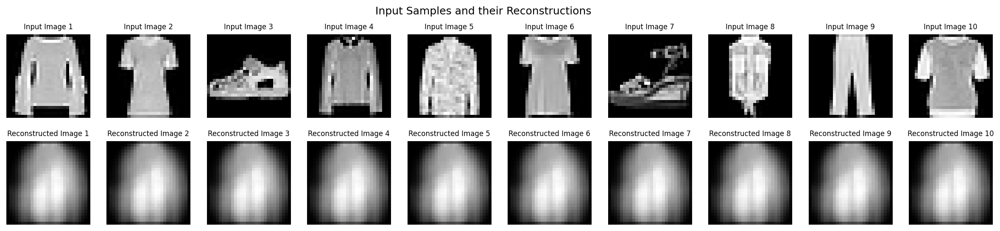

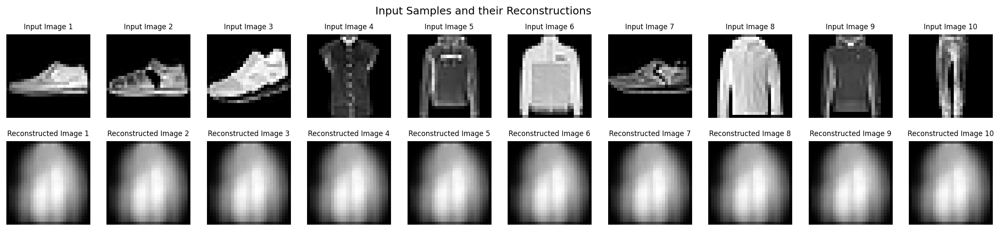

Epoch 7/10, Loss: 0.3468


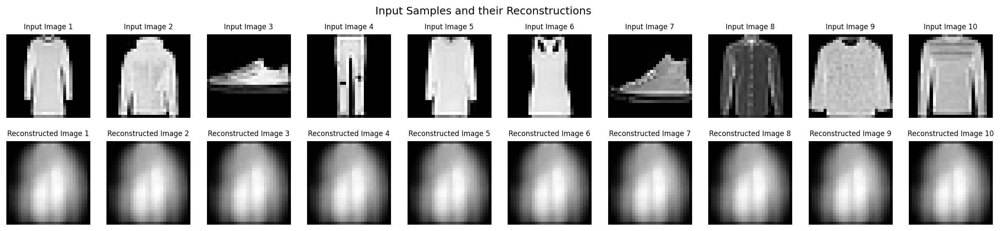

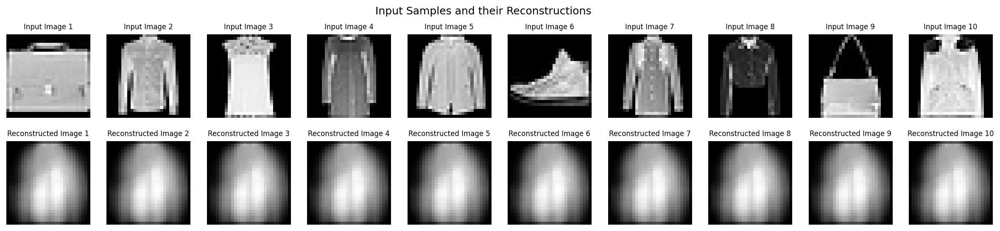

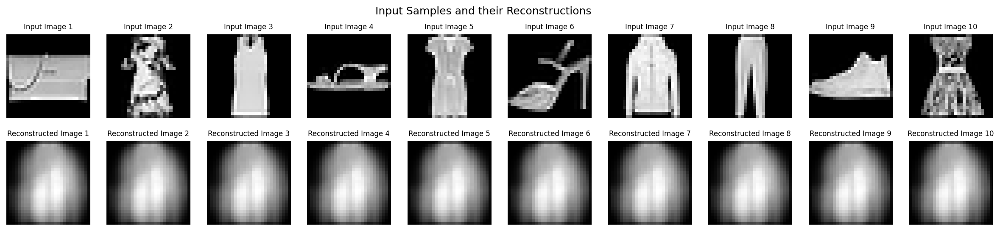

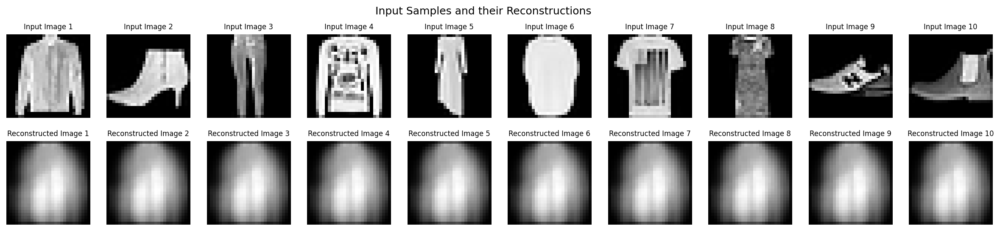

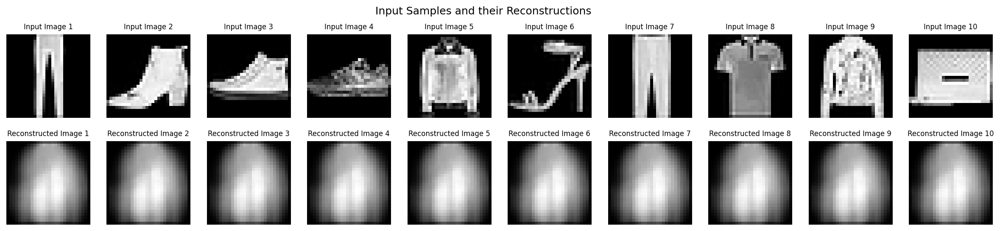

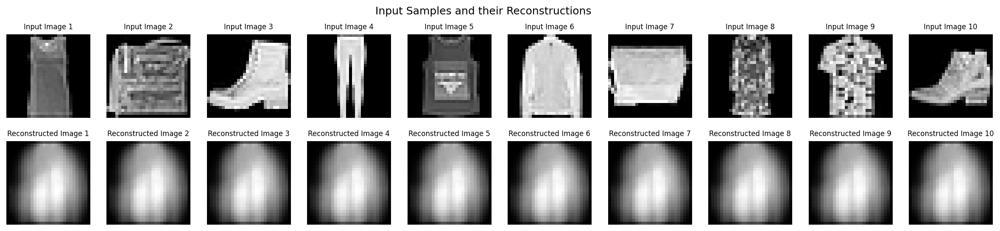

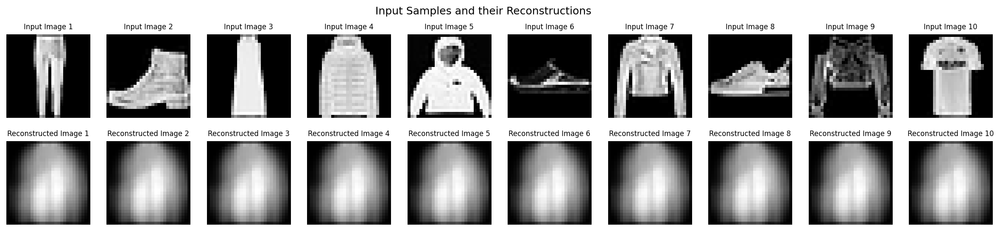

Epoch 8/10, Loss: 0.3479


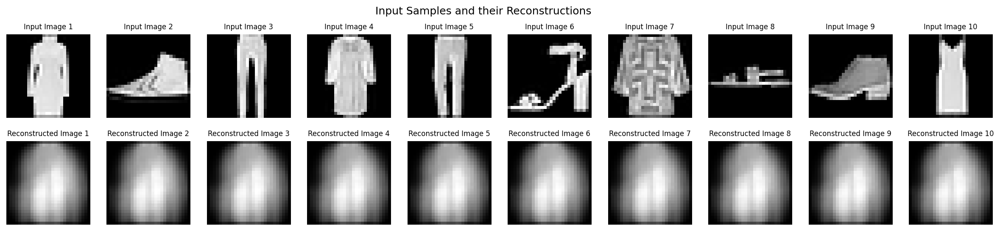

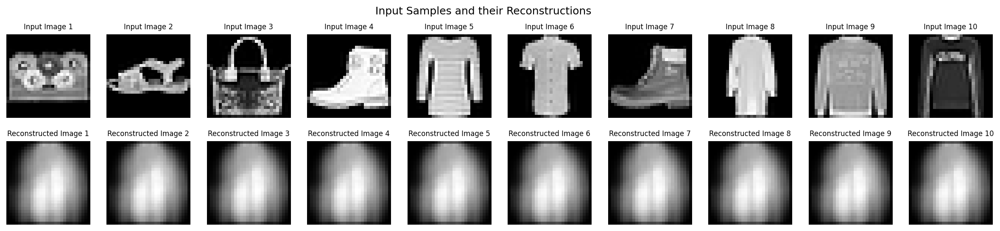

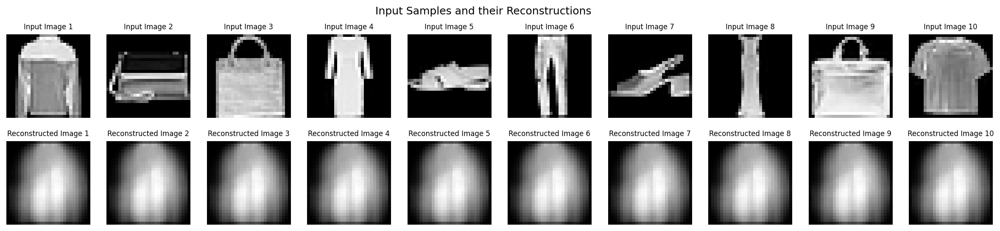

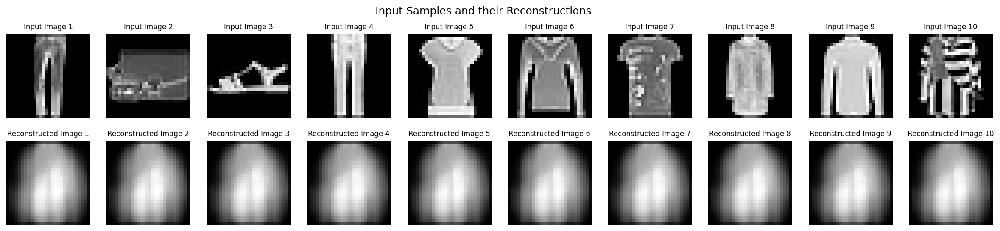

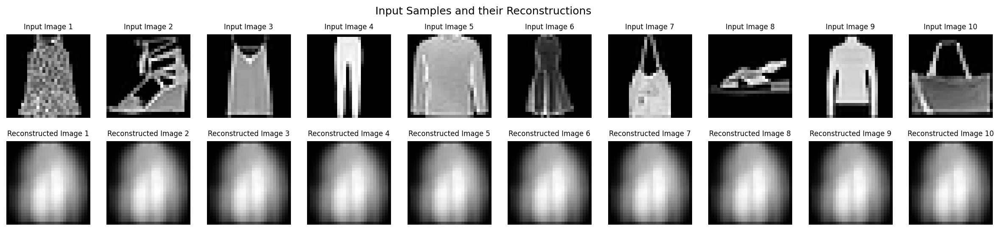

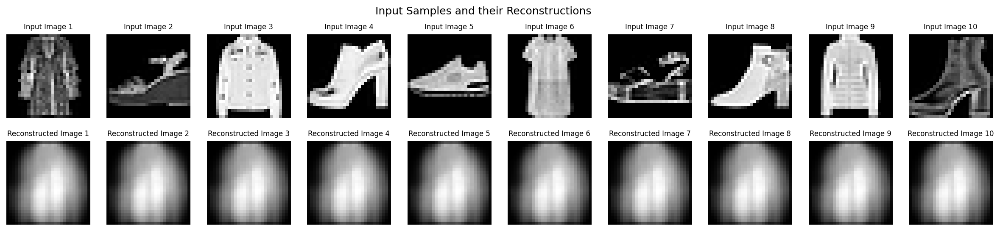

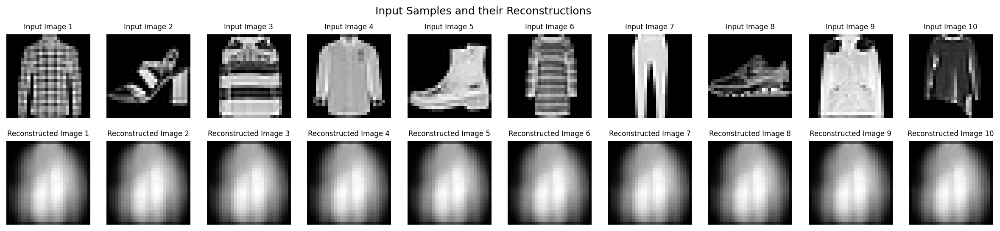

Epoch 9/10, Loss: 0.3469


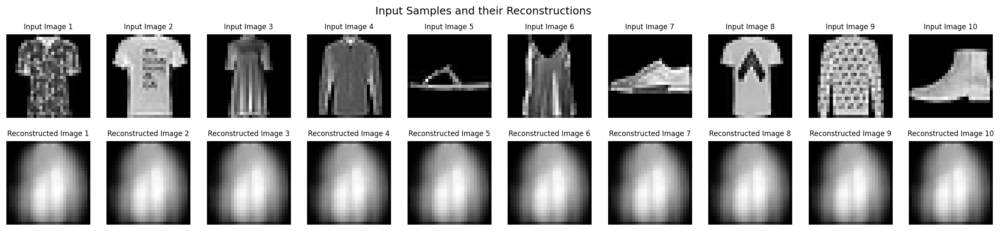

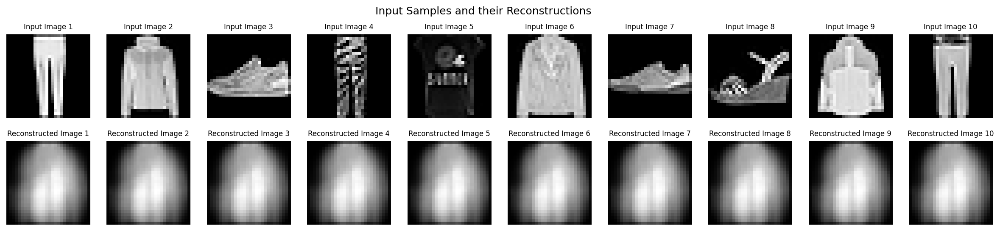

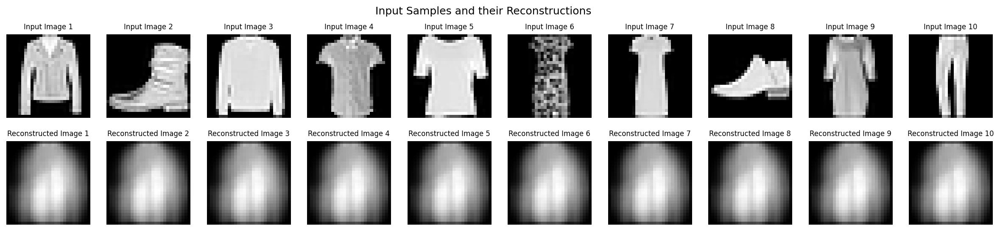

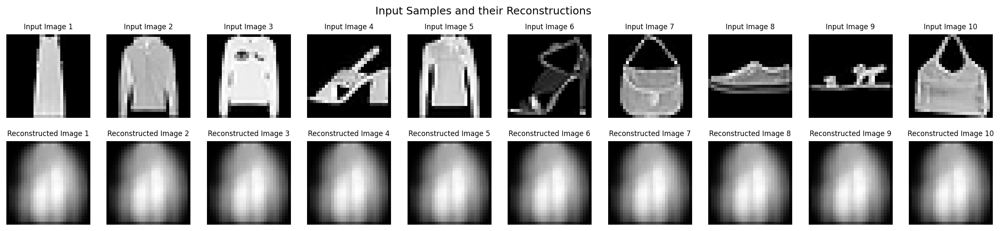

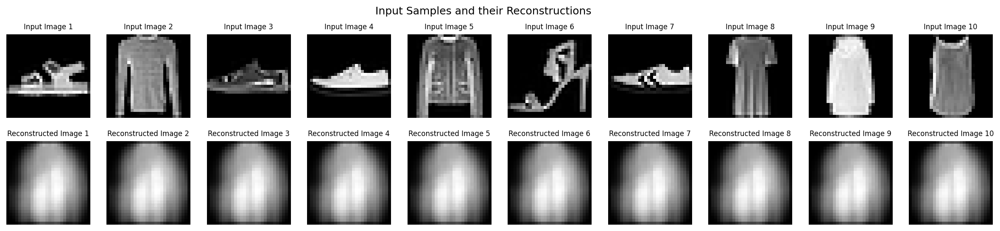

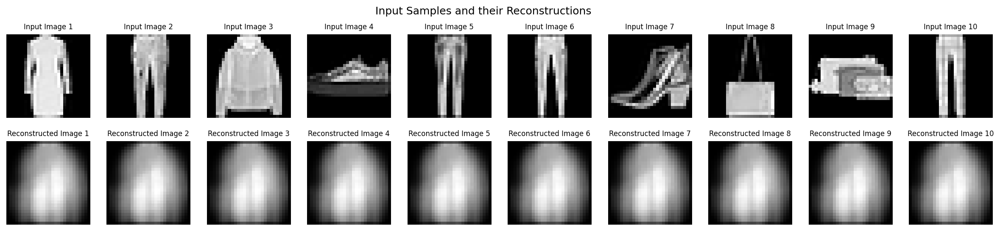

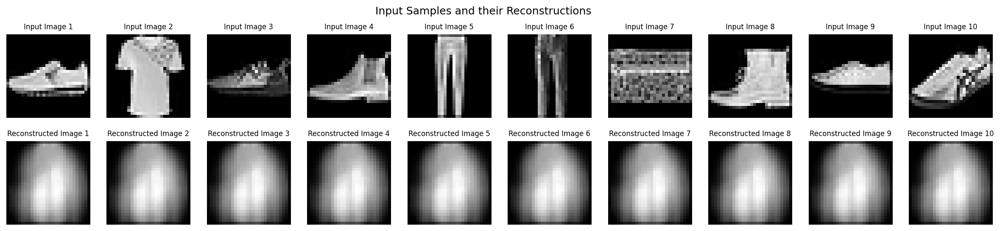

Epoch 10/10, Loss: 0.3470


In [13]:
# test the model
for epoch in range(epochs):
    test_loss = test(autoencoder, testloader, criterion, device=device)
    test_losses.append(test_loss)
    print(f'Epoch {epoch+1}/{epochs}, Loss: {test_loss:.4f}')

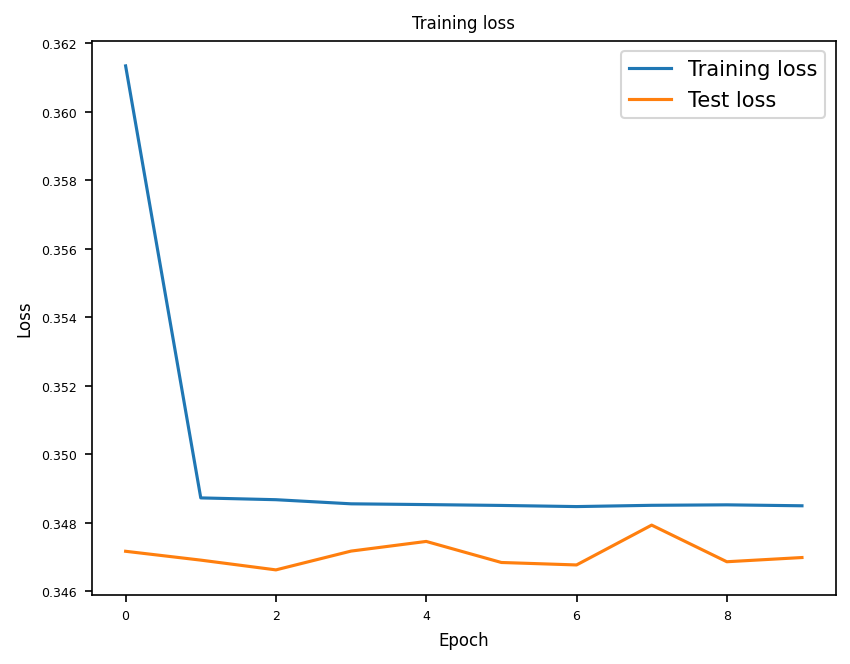

In [14]:
plot_loss(train_losses, test_losses, label='Training loss', path=RESULTS_DIR+'ae_loss_curve.png')

### Task 2: Denoising Autoencoders

2.1 Use your code for the previous task. The model stays the same. But instead of the original input apply your network to the noised input (see function add noise in network.py)

In [15]:
# Note that you should still count loss between not noised image and your prediction.
# Compute the testing loss
autoencoder = Autoencoder().to(device)
train_losses = []
test_losses = []

# train the model
for epoch in range(epochs):
    start = time.time()
    train_loss = train(autoencoder, trainloader, optimizer, criterion, noise=True, device=device)
    train_losses.append(train_loss)
    print(f'Epoch {epoch+1}/{epochs}, Loss: {train_loss:.4f}, Time: {time.time()-start:.2f} sec')


Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 28, 28])
Inpu

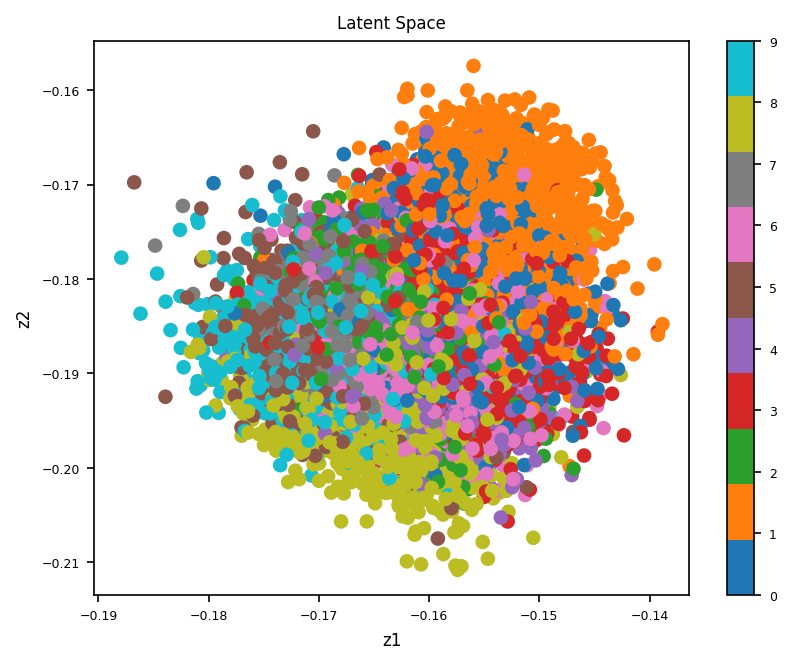

In [25]:
# Plot the latent space
plot_latent(autoencoder, trainloader, num_batches=BATCH_SIZE, path=f'{RESULTS_DIR}ae_latent_with_noise.png')

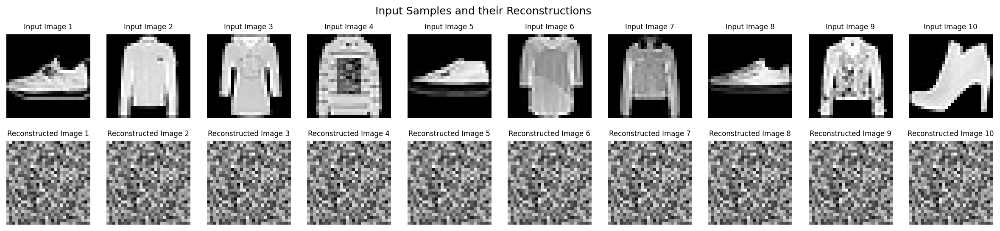

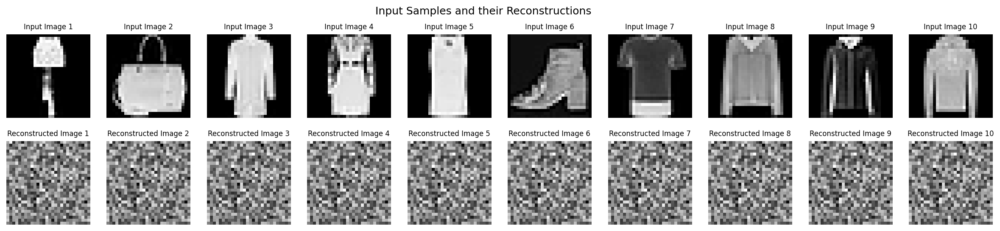

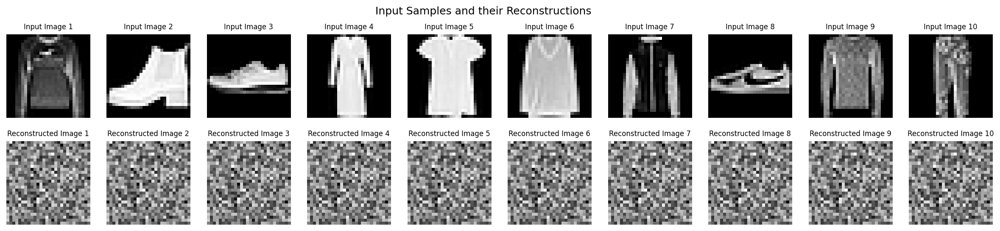

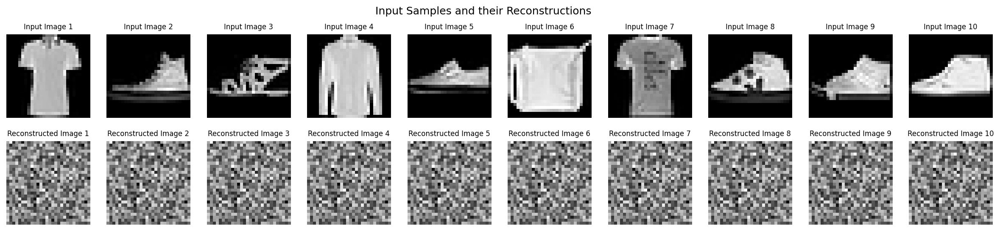

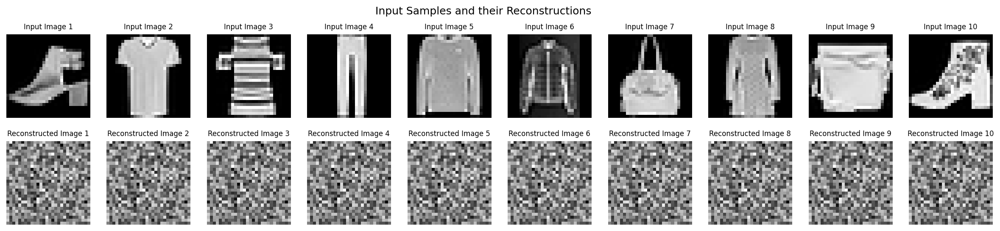

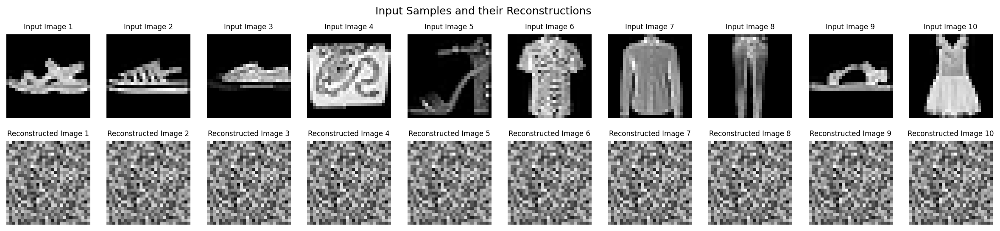

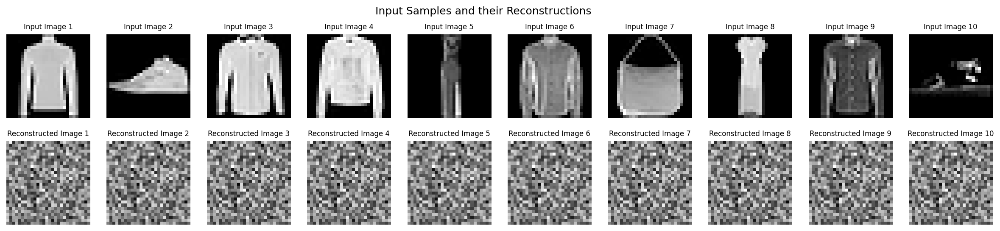

Epoch 1/10, Loss: 0.6837


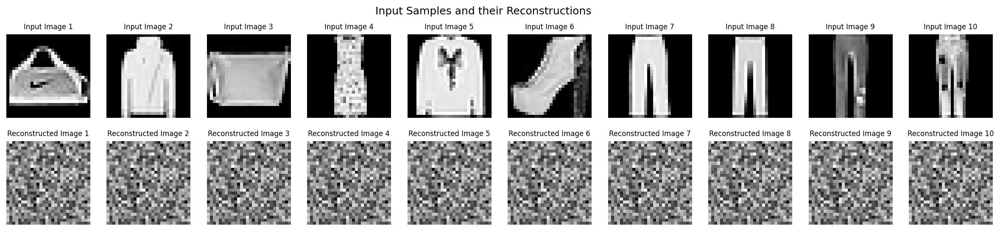

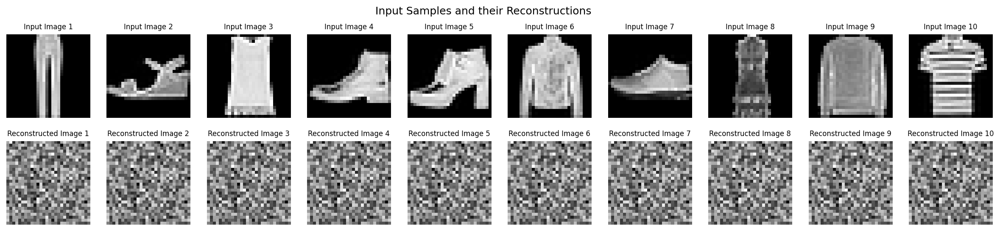

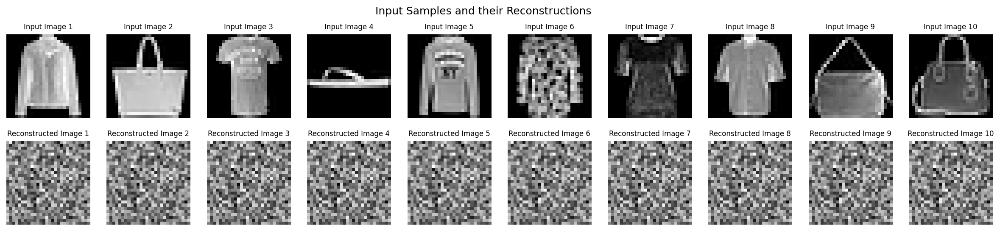

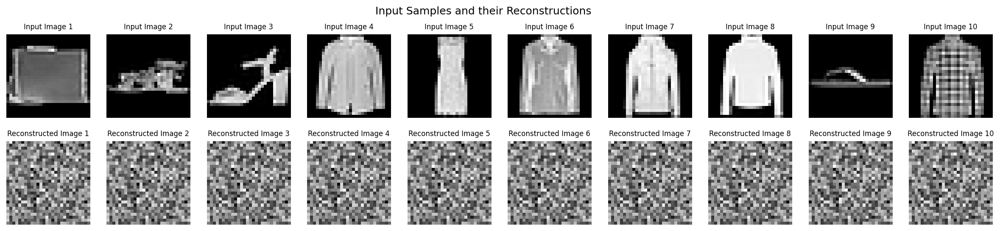

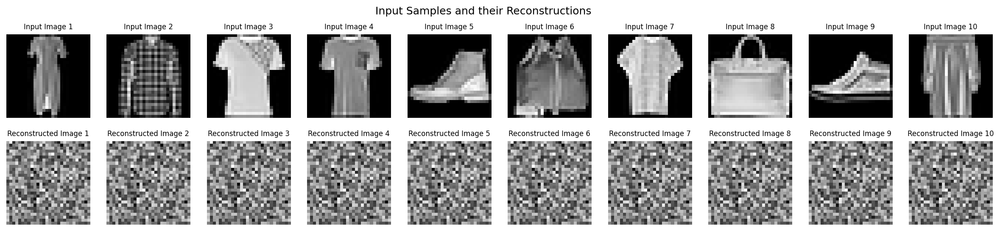

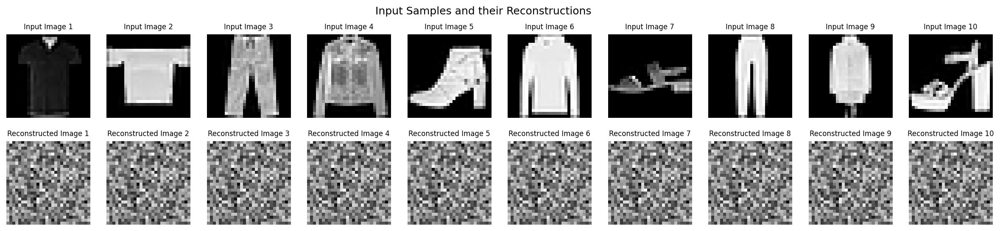

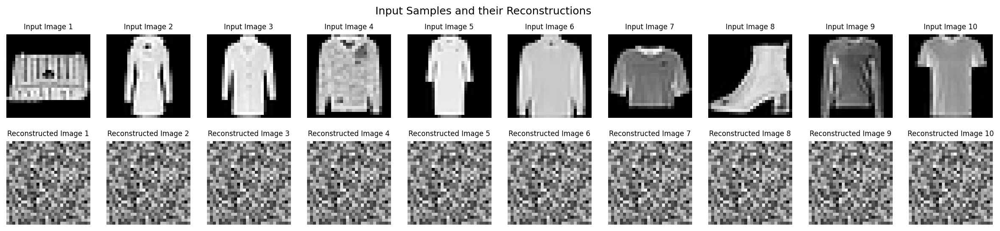

Epoch 2/10, Loss: 0.6834


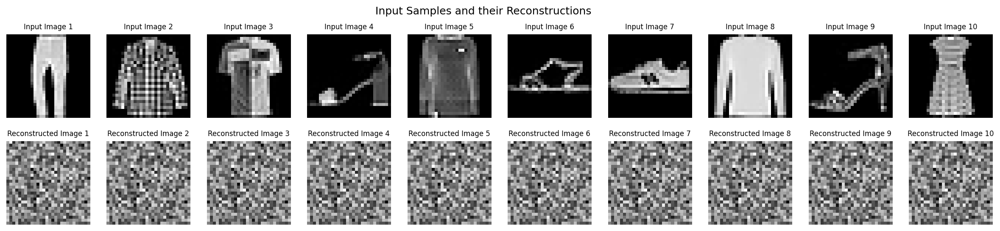

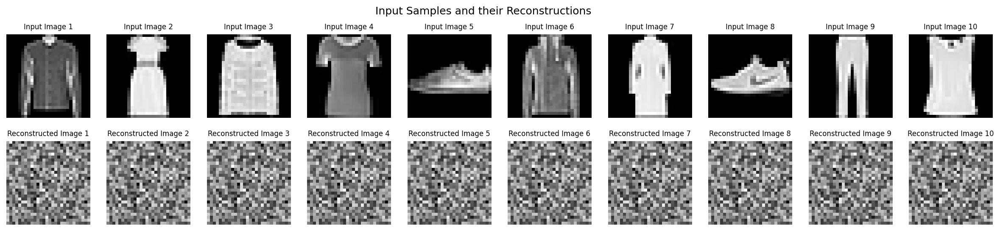

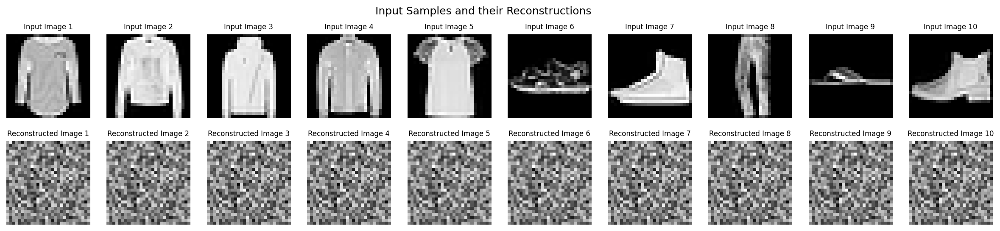

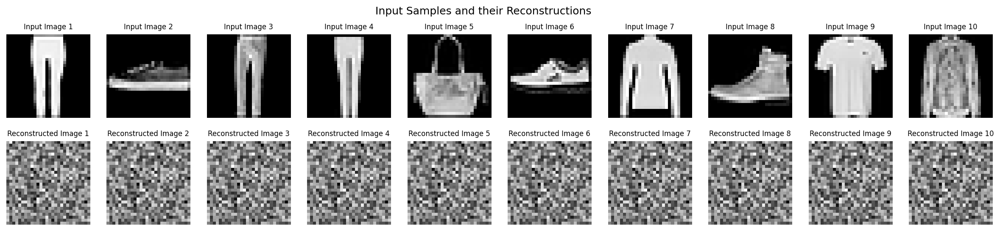

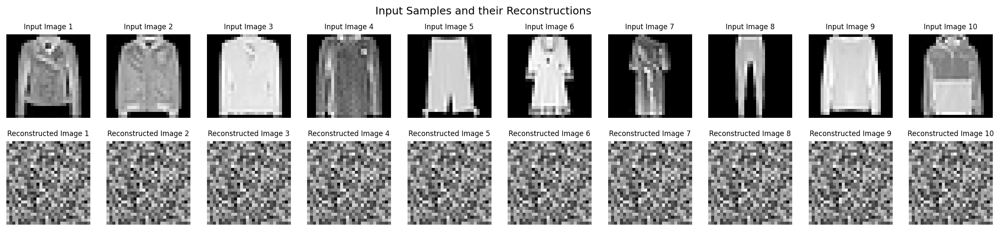

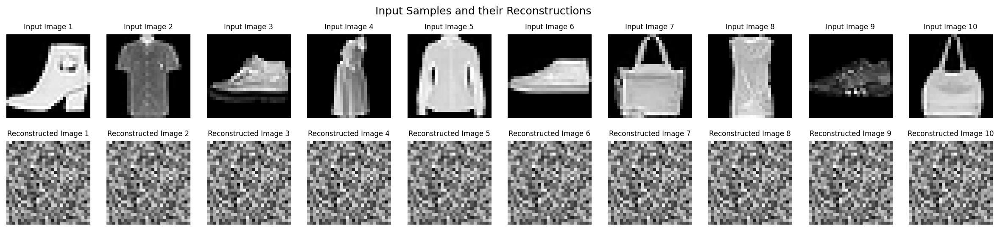

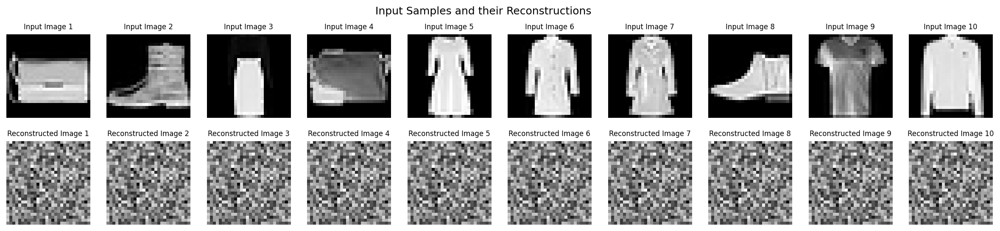

Epoch 3/10, Loss: 0.6832


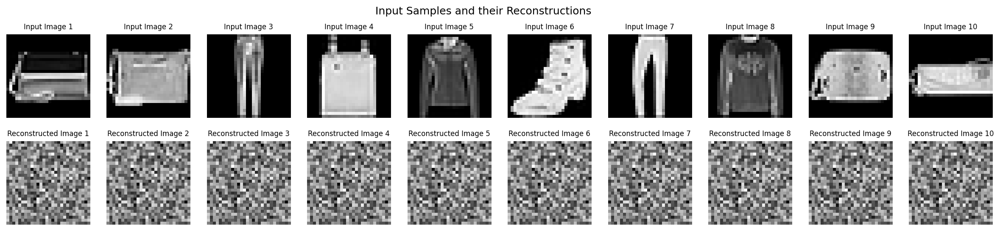

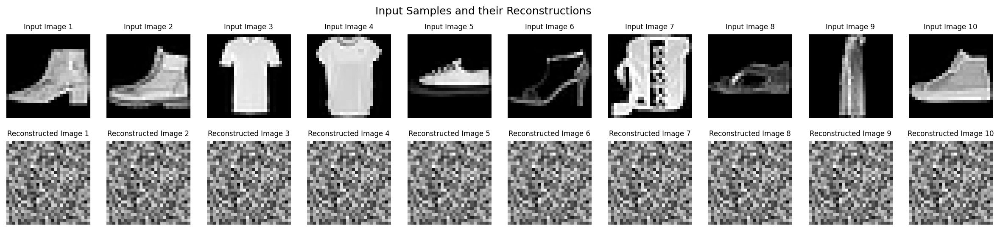

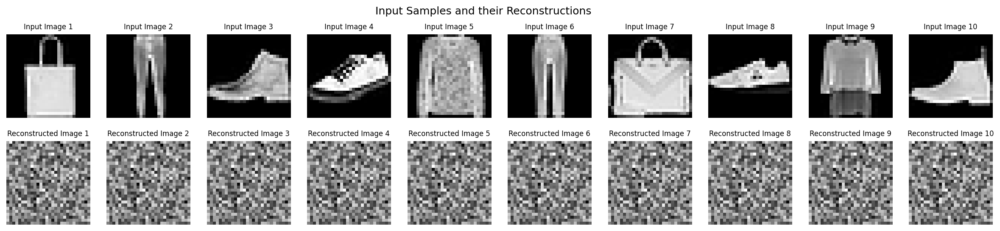

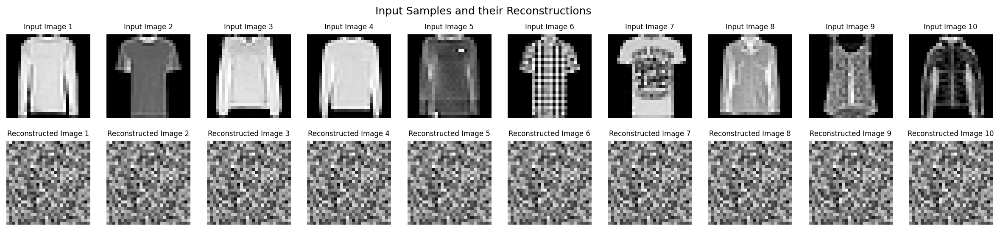

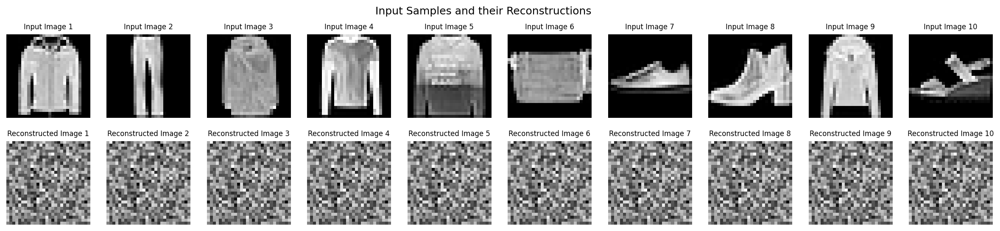

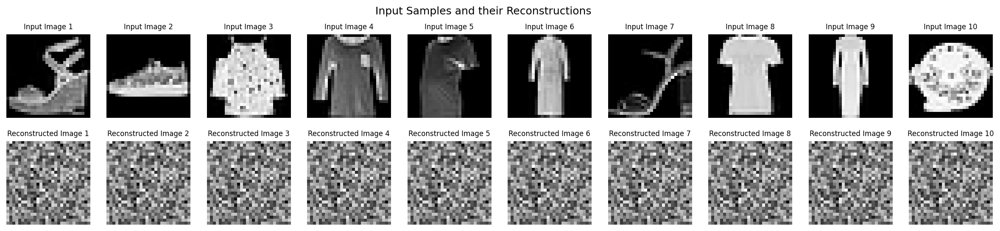

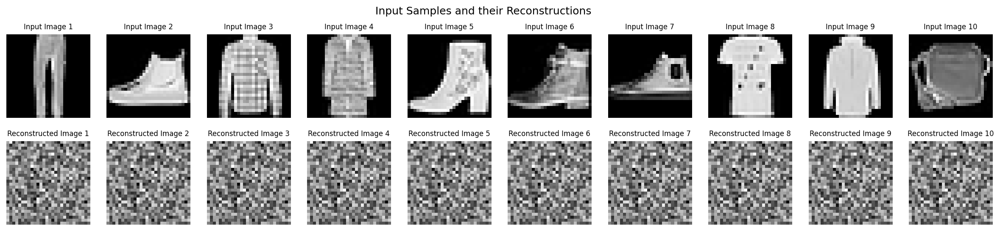

Epoch 4/10, Loss: 0.6829


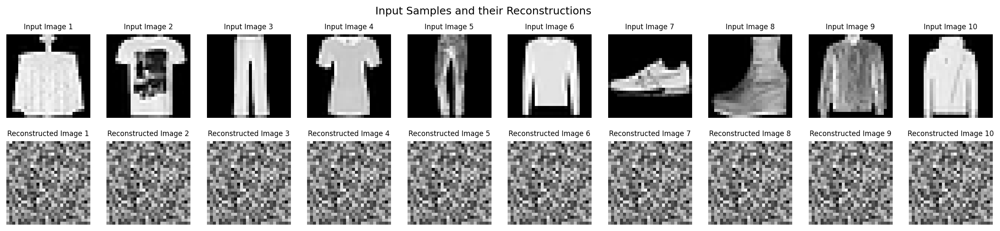

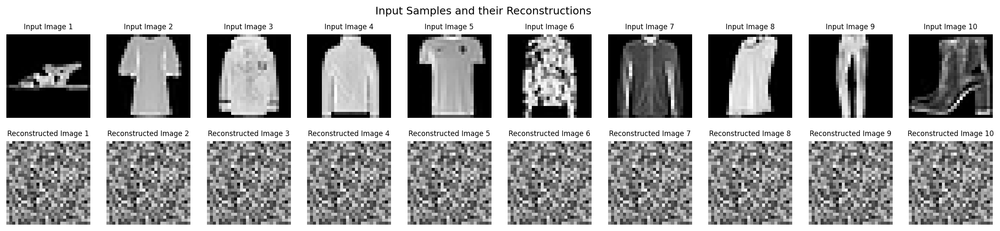

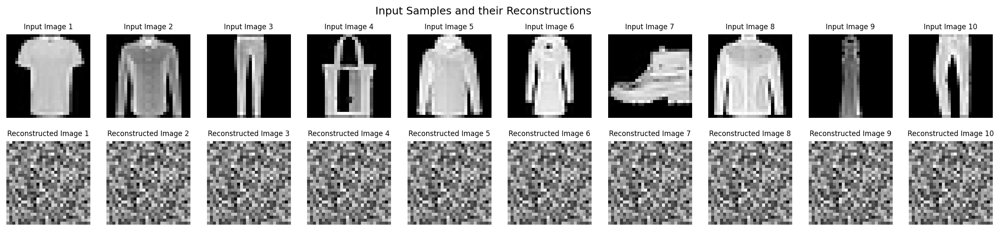

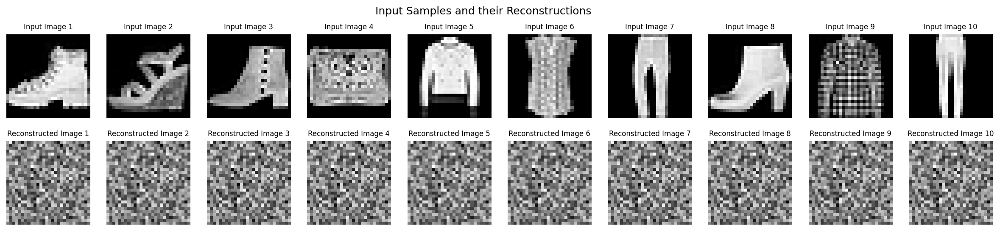

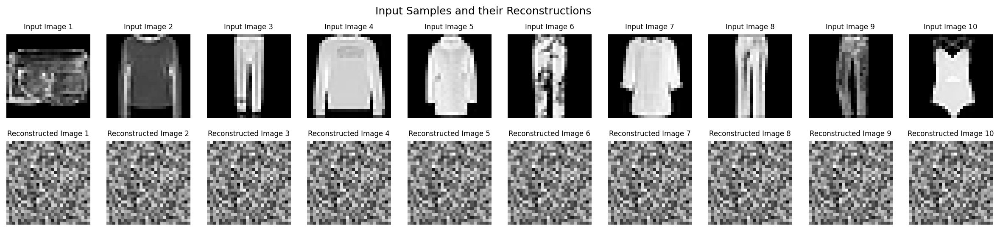

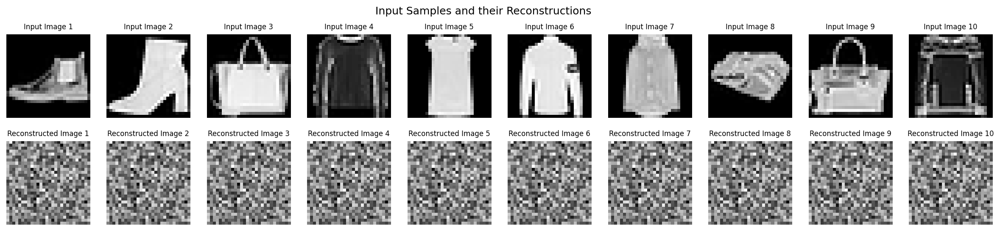

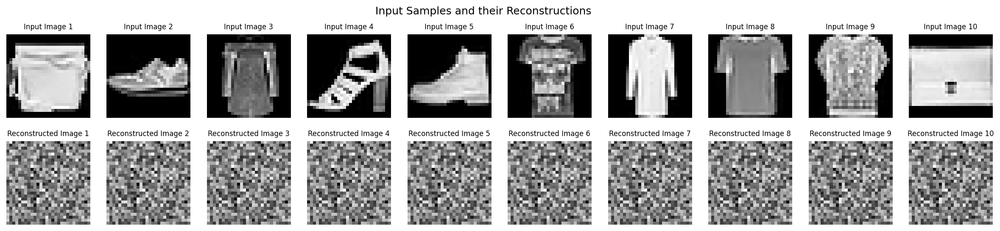

Epoch 5/10, Loss: 0.6826


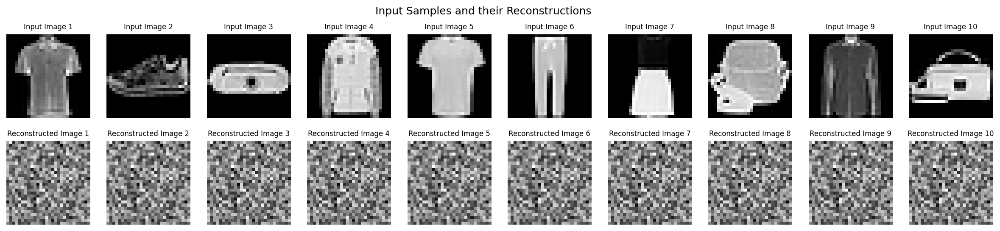

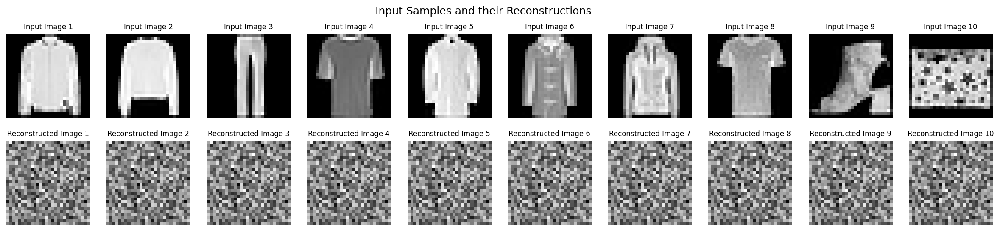

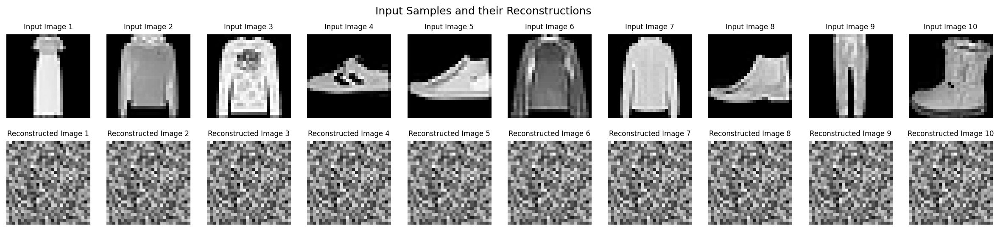

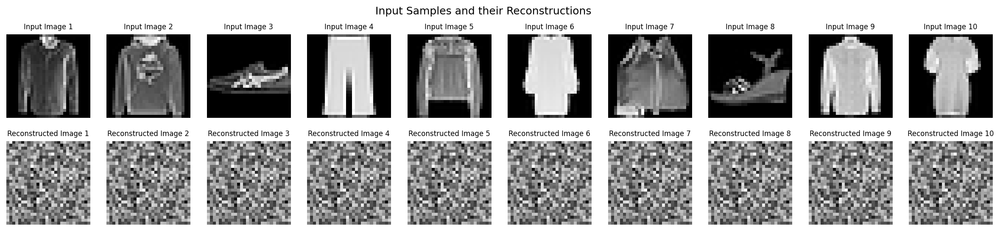

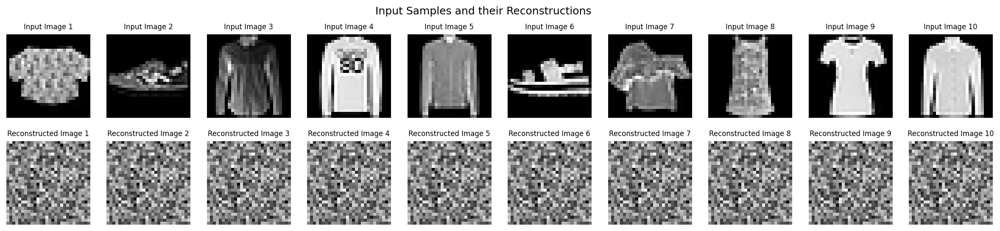

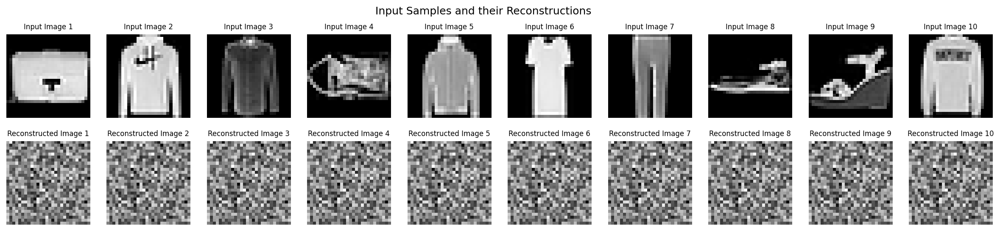

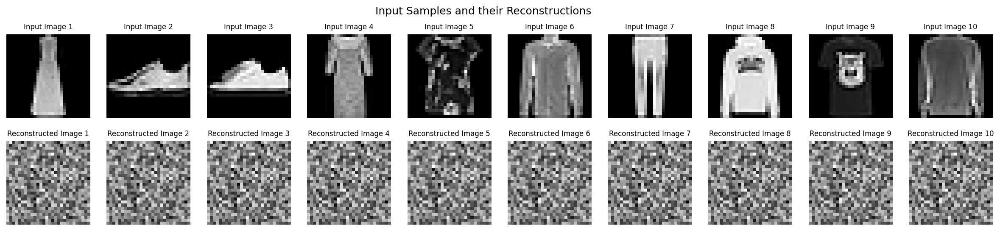

Epoch 6/10, Loss: 0.6834


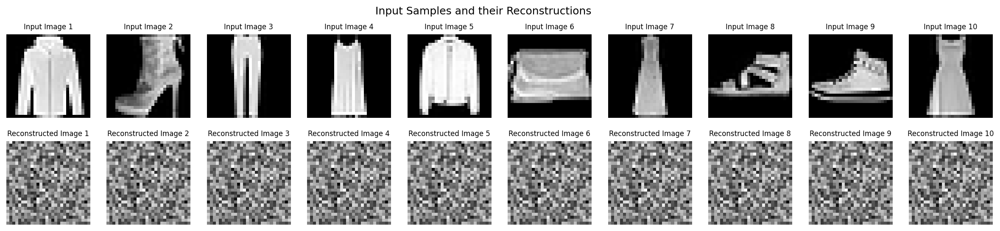

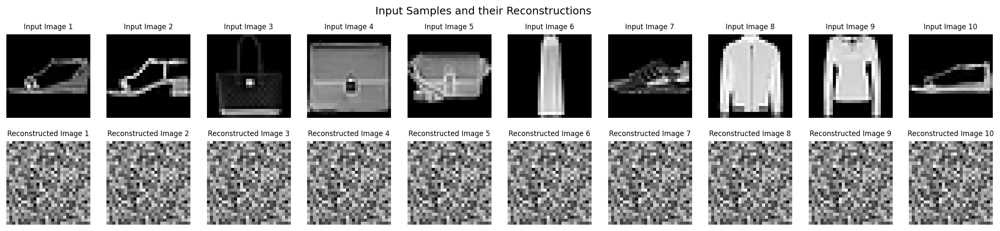

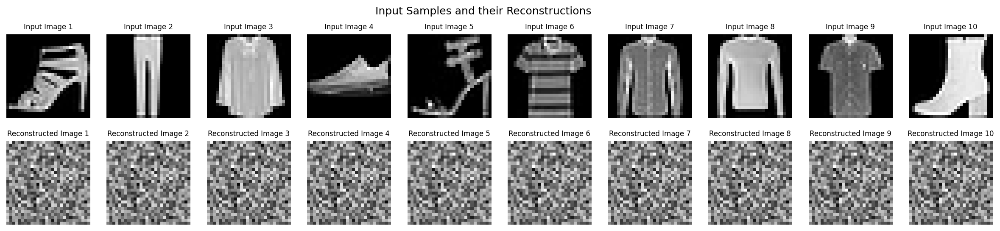

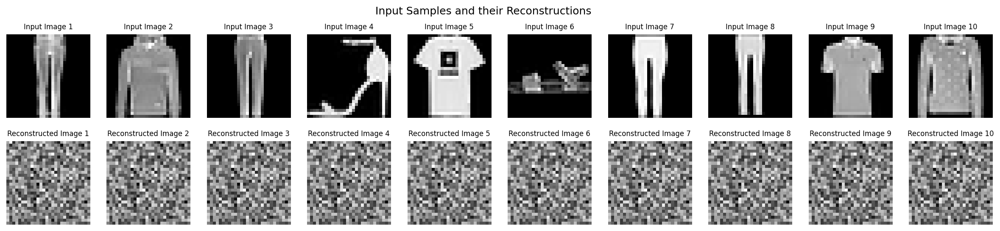

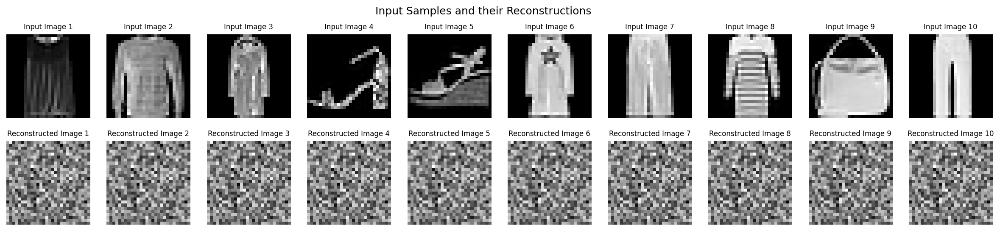

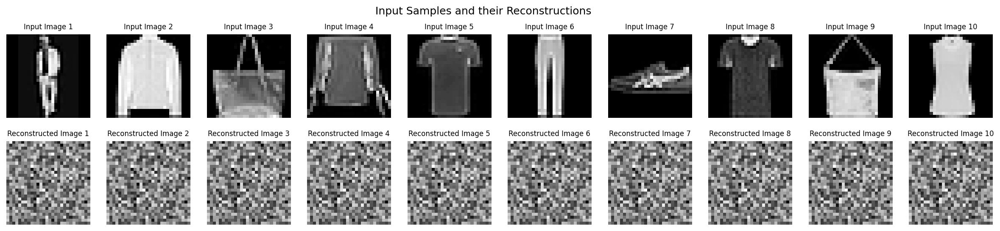

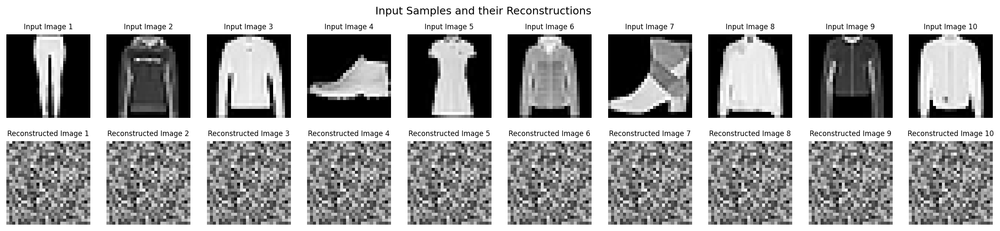

Epoch 7/10, Loss: 0.6832


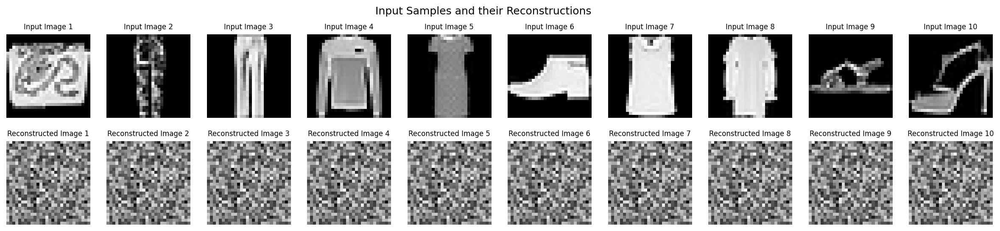

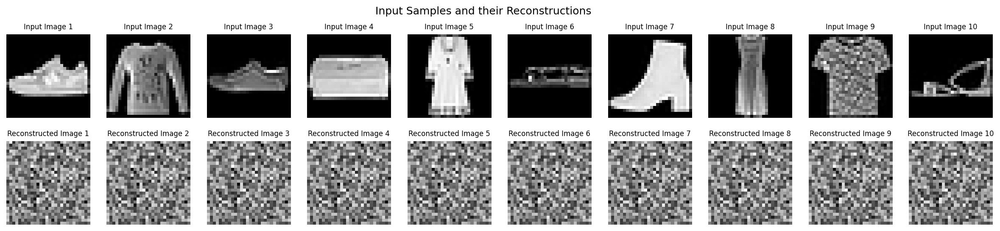

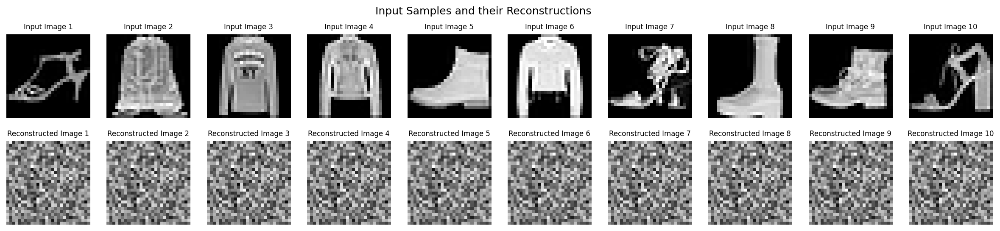

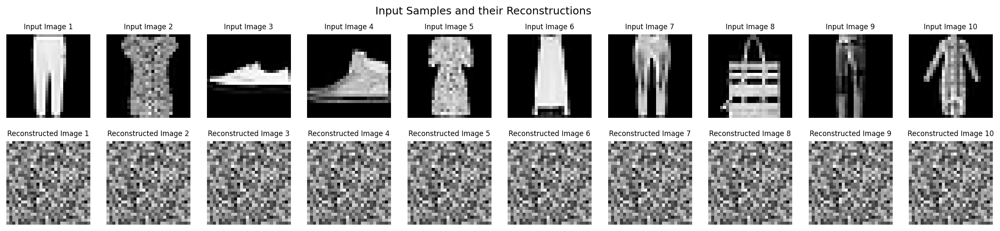

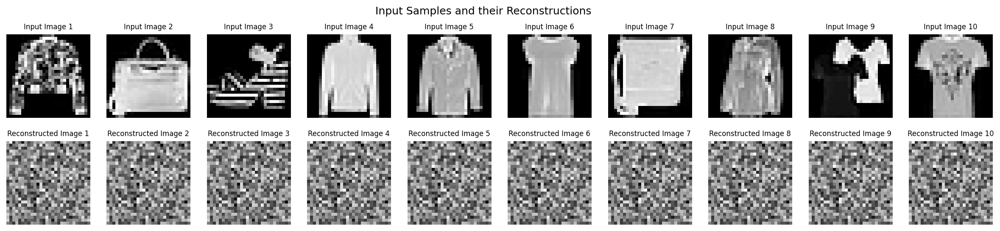

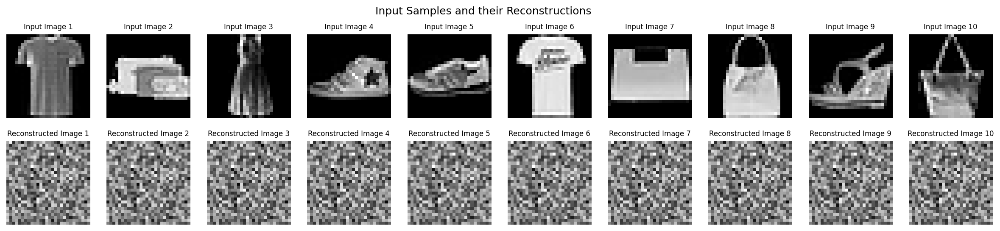

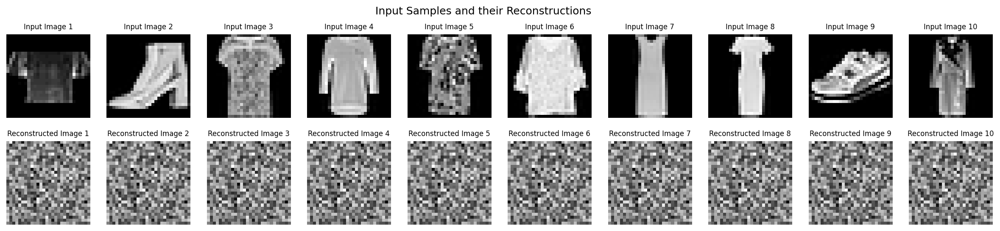

Epoch 8/10, Loss: 0.6836


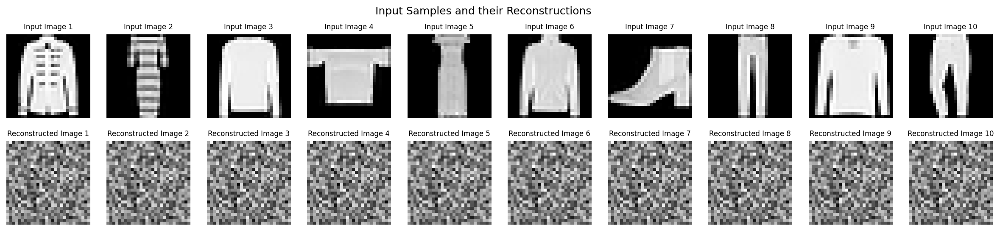

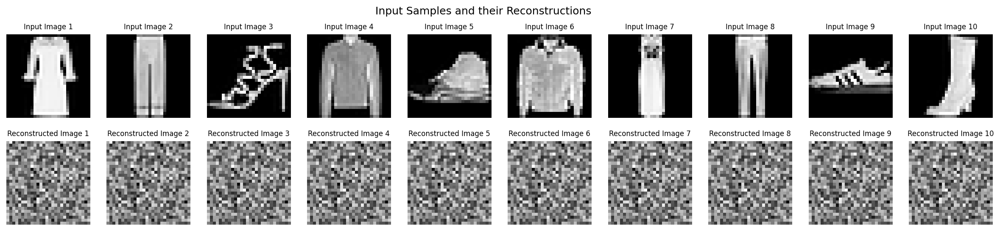

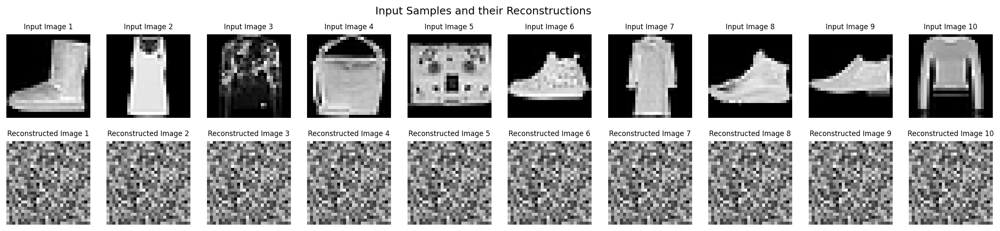

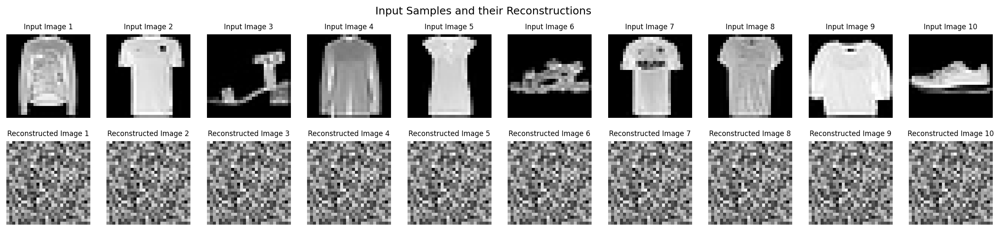

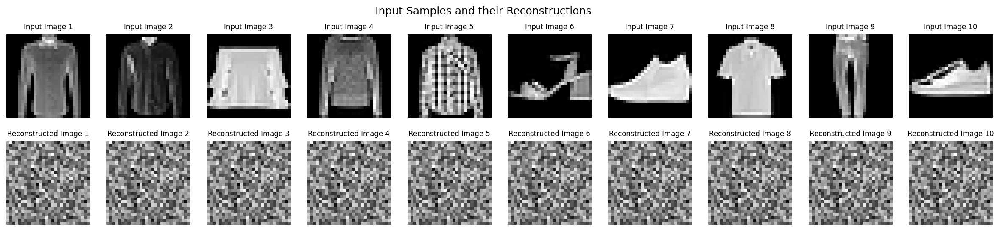

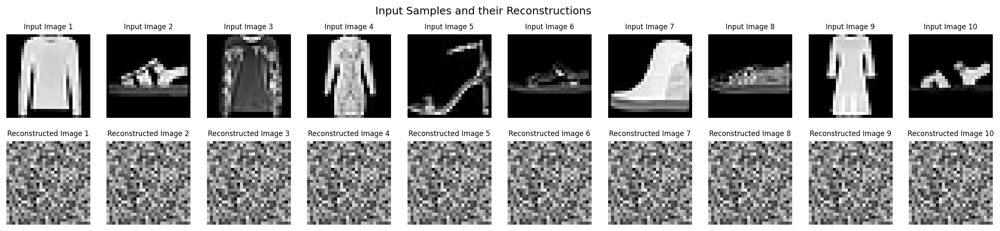

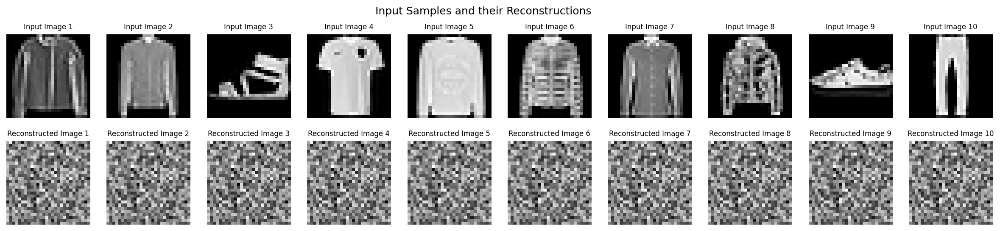

Epoch 9/10, Loss: 0.6831


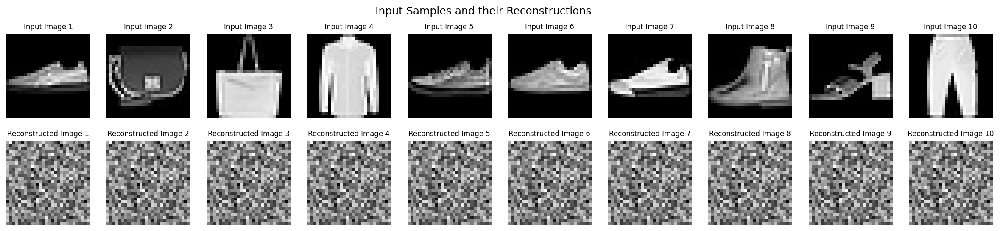

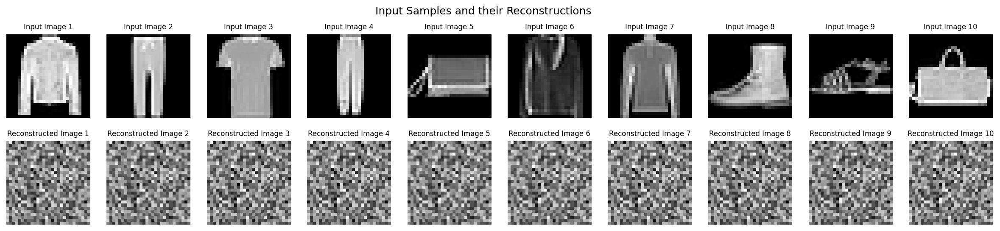

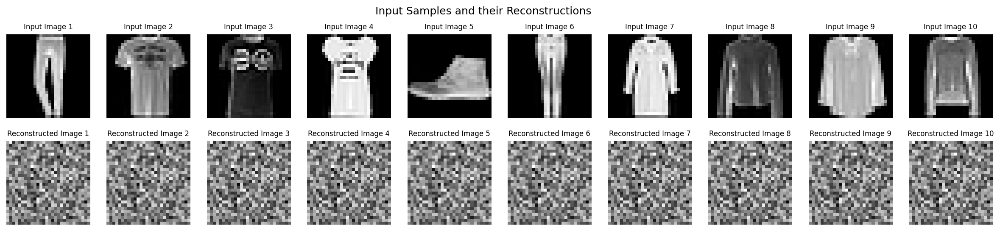

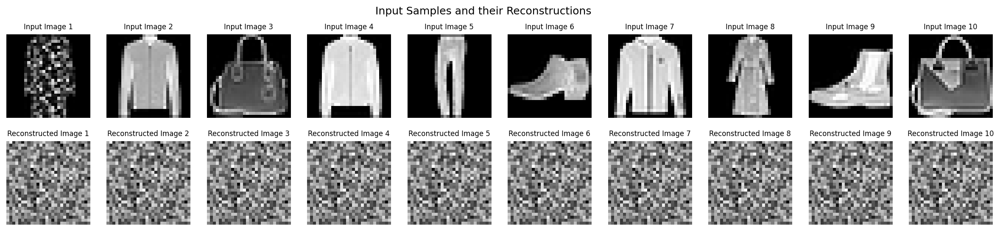

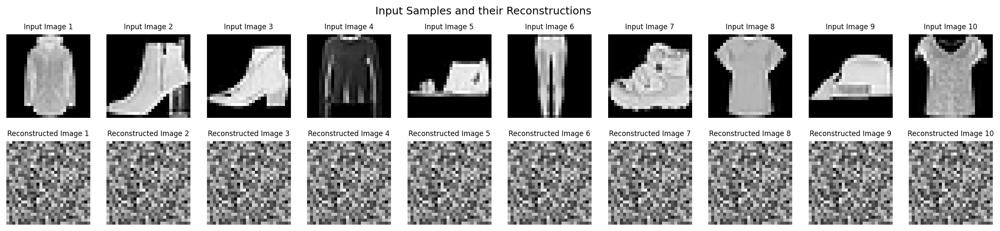

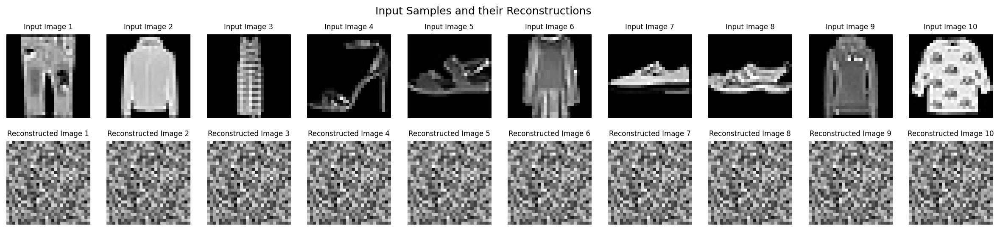

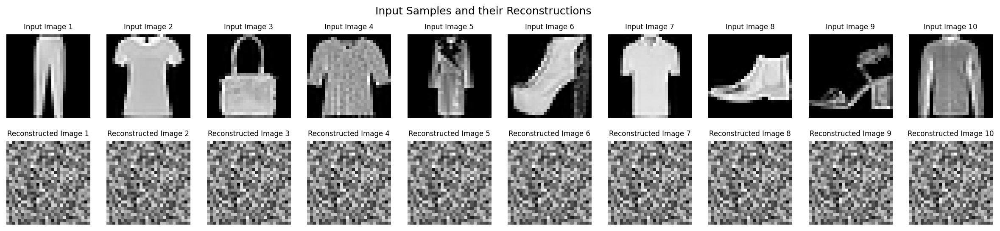

Epoch 10/10, Loss: 0.6835


In [16]:
# test the model
for epoch in range(epochs):
    test_loss = test(autoencoder, testloader, criterion, device=device)
    test_losses.append(test_loss)
    print(f'Epoch {epoch+1}/{epochs}, Loss: {test_loss:.4f}')

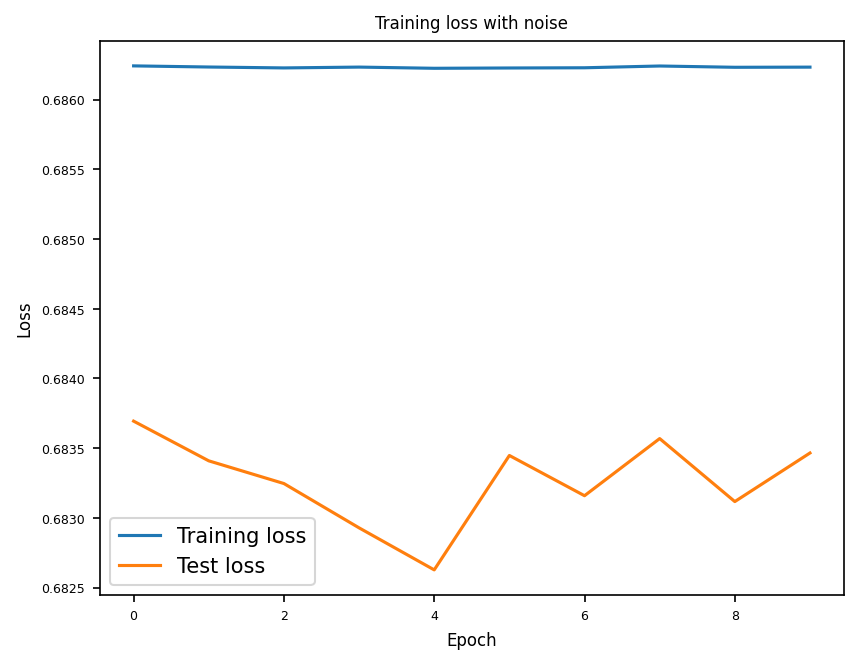

In [17]:
# Plot the loss curve
plot_loss(train_losses, test_losses, label='Training loss with noise', path=RESULTS_DIR+'ae_loss_curve_noise.png')

**Describe how has the performance of the model changed.**

TODO

### Task 3: Implement a Convolutional Autoencoder

In [18]:
# 3.1 mplement a convolutional autoencoder using the class torch.nn.Module4 from pytorch. Use the provided starter code as a template.
conv_autoencoder = ConvAutoencoder().to(device)
print(conv_autoencoder)

ConvAutoencoder(
  (encoder): ConvEncoder(
    (encoder): Sequential(
      (0): Conv2d(1, 4, kernel_size=(5, 5), stride=(1, 1))
      (1): LeakyReLU(negative_slope=0.01, inplace=True)
      (2): Conv2d(4, 8, kernel_size=(5, 5), stride=(1, 1))
      (3): LeakyReLU(negative_slope=0.01, inplace=True)
      (4): Flatten(start_dim=1, end_dim=-1)
      (5): Linear(in_features=3200, out_features=10, bias=True)
      (6): Softmax(dim=1)
    )
  )
  (decoder): ConvDecoder(
    (decoder): Sequential(
      (0): Linear(in_features=10, out_features=400, bias=True)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=400, out_features=4000, bias=True)
      (3): ReLU(inplace=True)
      (4): Unflatten(dim=1, unflattened_size=(10, 20, 20))
      (5): ConvTranspose2d(10, 10, kernel_size=(5, 5), stride=(1, 1))
      (6): ReLU(inplace=True)
      (7): ConvTranspose2d(10, 1, kernel_size=(5, 5), stride=(1, 1))
      (8): Tanh()
    )
  )
)


In [19]:
# 3.2 Use the mean squared error5 to implement the reconstruction error of the autoencoder. 
# The error will be computed between the input image x and the output of the autoencoder g(f (x)).

criterion = nn.MSELoss()

In [20]:
# 3.3 For training use Adam as optimizer with a learning rate of 0.001, weight decay of 1e −5 and a batch size of 128. Run it for at least 50 epochs.
lr = 0.001
weight_decay = 1e-5
epochs = 10 # 50 TODO

# create optimizer
optimizer = torch.optim.Adam(conv_autoencoder.parameters(), lr=lr, weight_decay=weight_decay) # Adam optimizer

In [21]:
# Report the loss on the training split for each epoch, and every ten epochs on the test set
train_losses = []
test_losses = []

# train the model
for epoch in range(epochs):
    start = time.time()
    train_loss = train(conv_autoencoder, trainloader, optimizer, criterion, device=device)
    train_losses.append(train_loss)
    print(f'Epoch {epoch+1}/{epochs}, Loss: {train_loss:.4f}, Time: {time.time()-start:.2f} sec')

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Input shape: torch.Size([128, 1, 28, 28]), Output shape: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Input shape: torch.Size(

Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([128, 10])
Encoder Shape of x: torch.Size([12

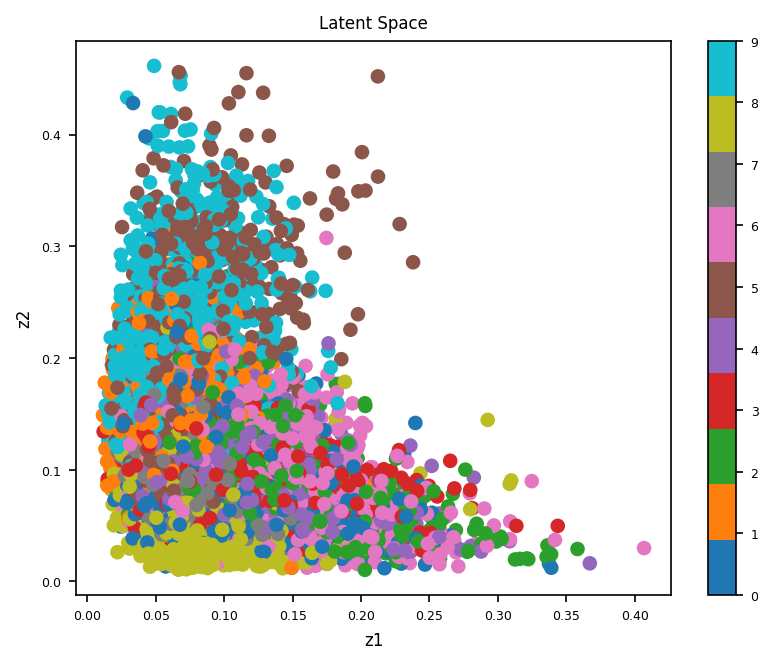

In [22]:
# Plot the latent space
plot_latent(conv_autoencoder, trainloader, num_batches=BATCH_SIZE, path=f'{RESULTS_DIR}aeconv_latent.png')

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


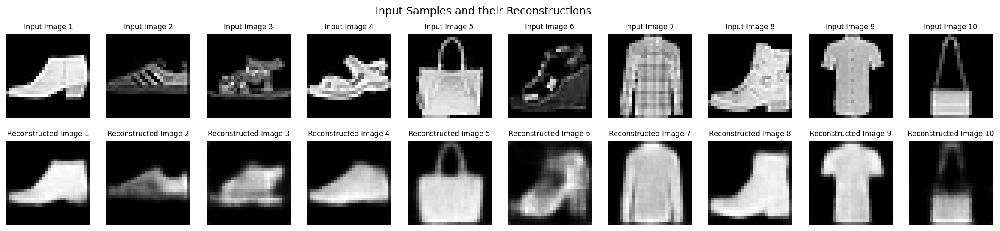

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


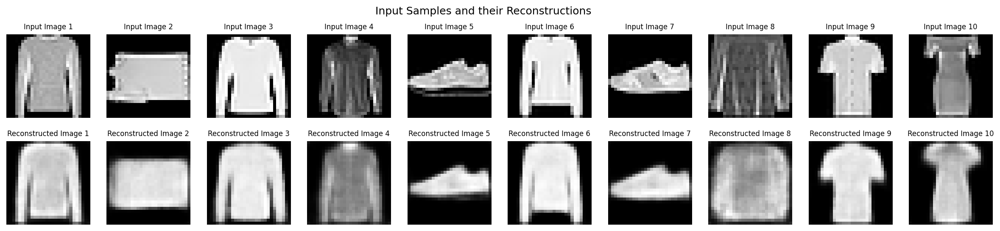

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


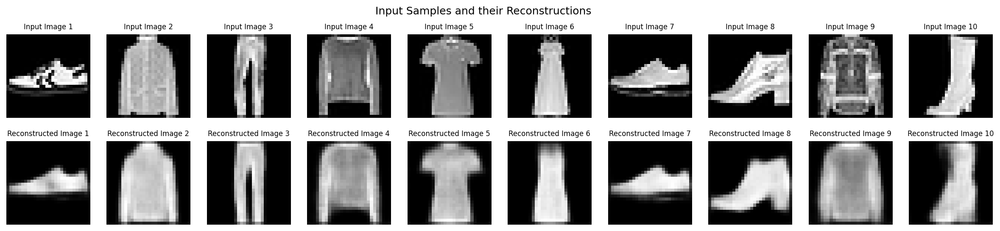

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


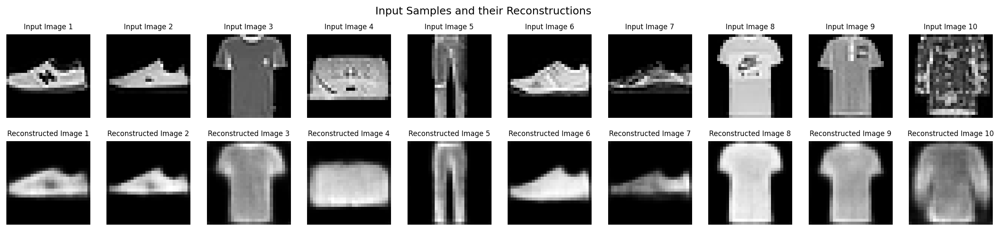

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


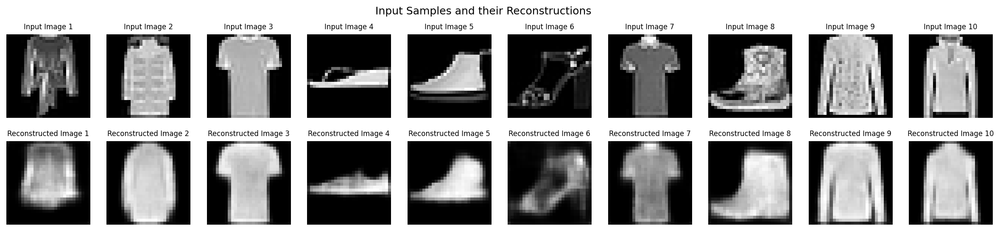

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


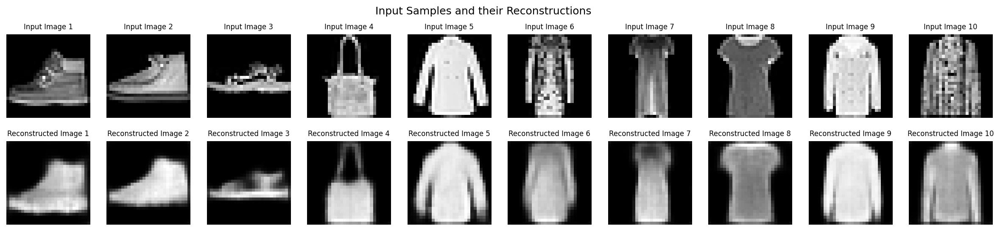

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


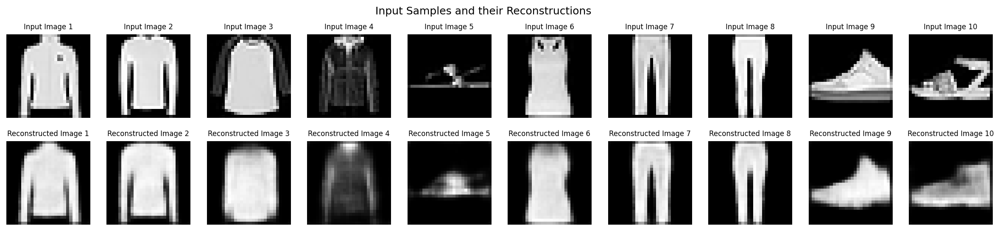

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 1/10, Loss: 0.0603
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch

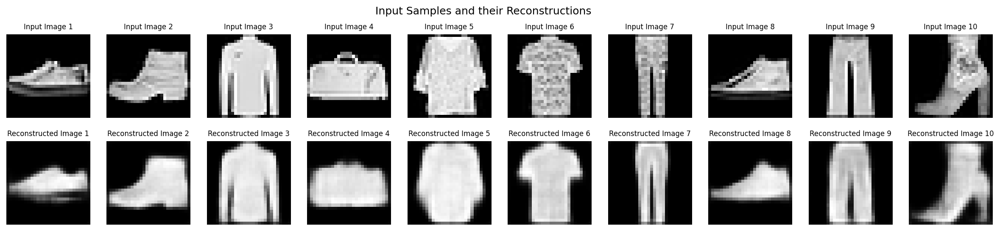

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


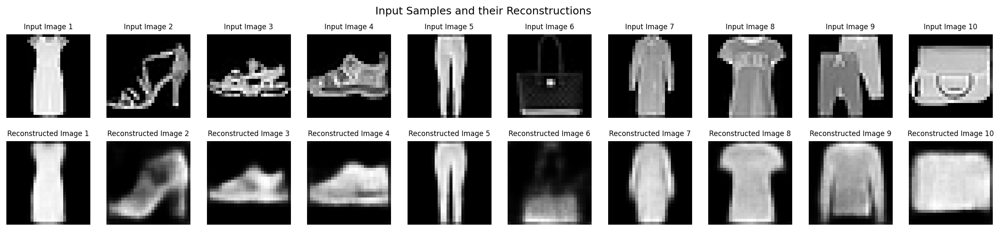

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


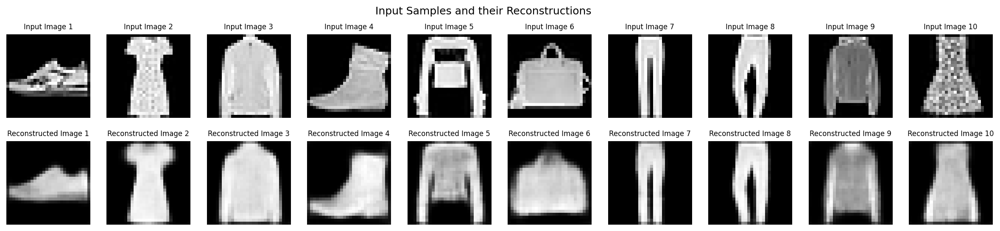

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


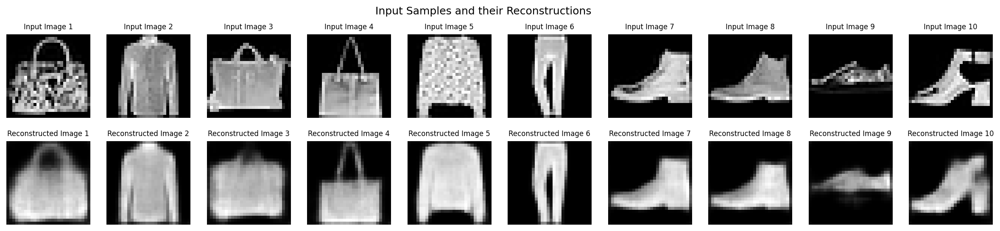

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


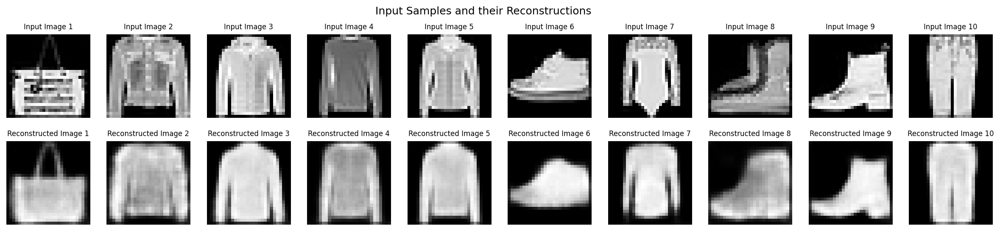

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


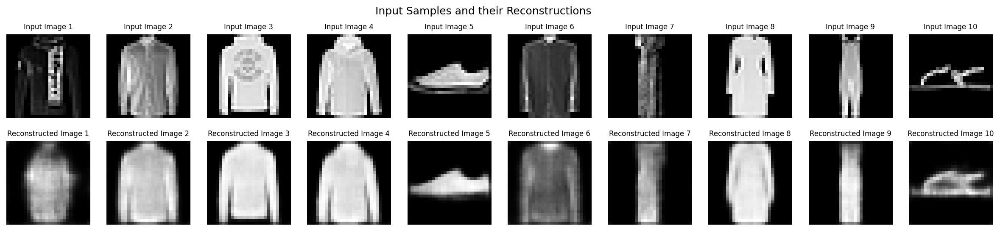

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


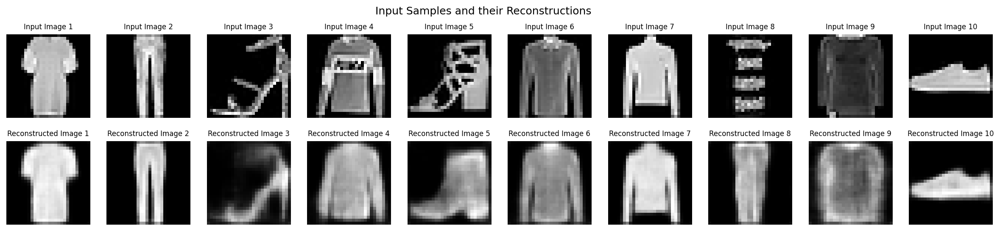

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 2/10, Loss: 0.0605
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch

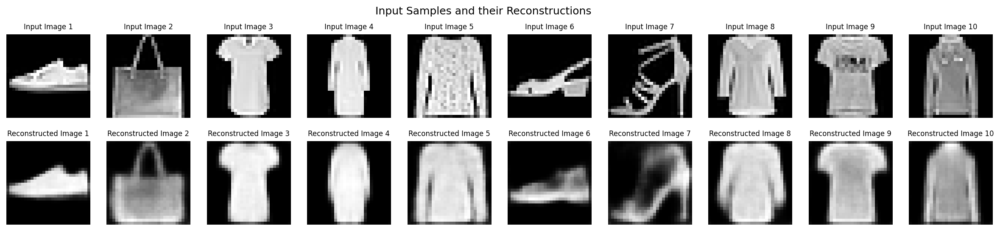

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


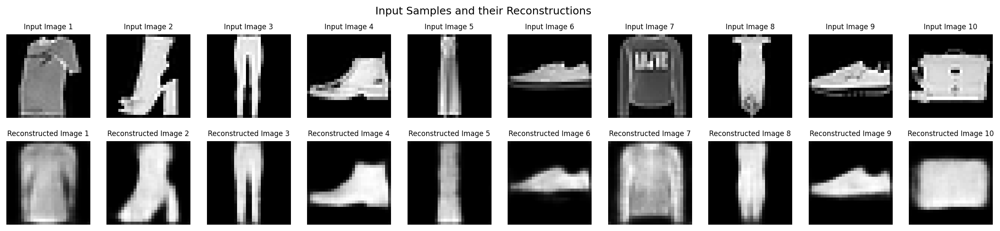

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


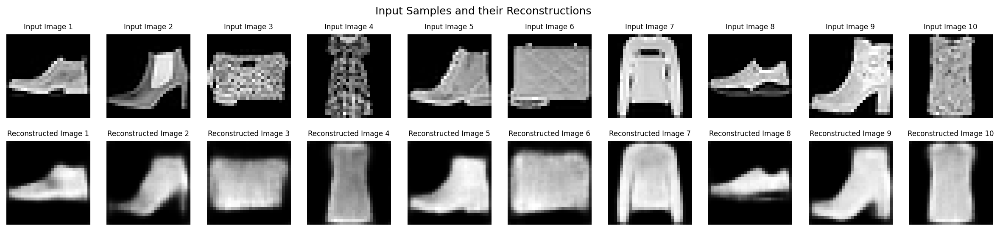

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


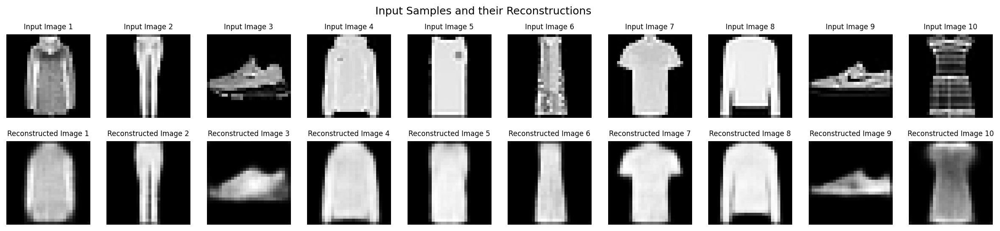

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


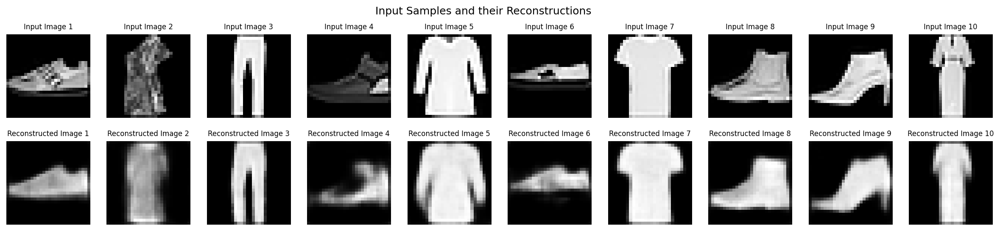

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


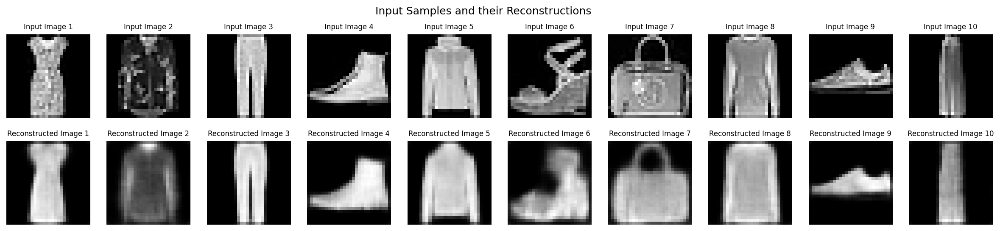

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


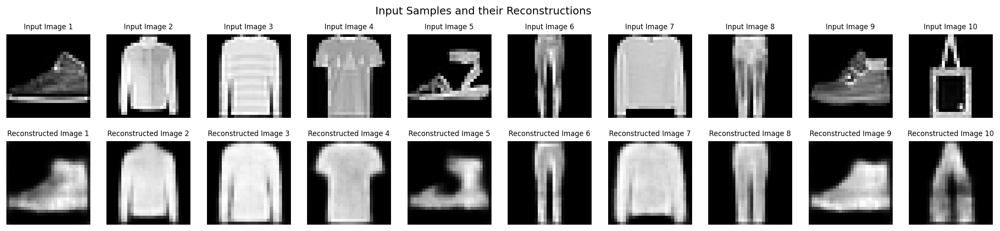

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 3/10, Loss: 0.0601
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch

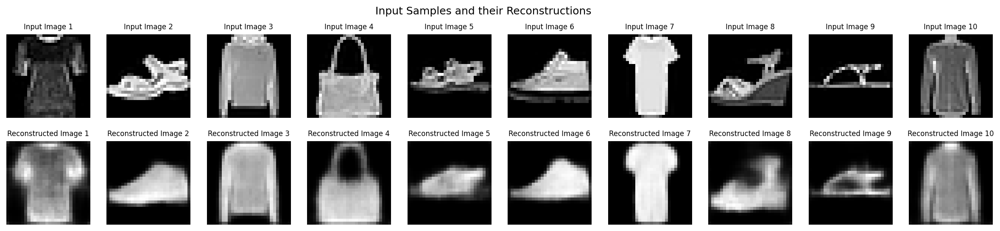

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


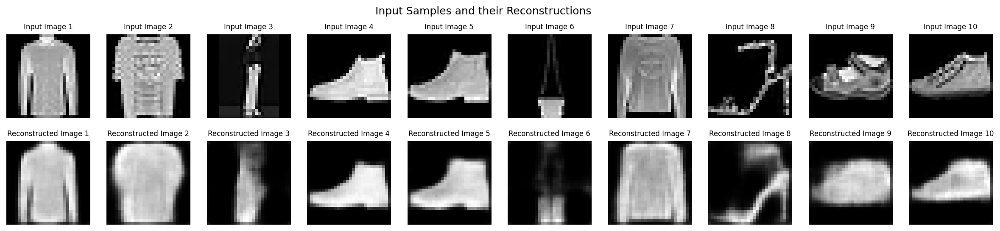

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


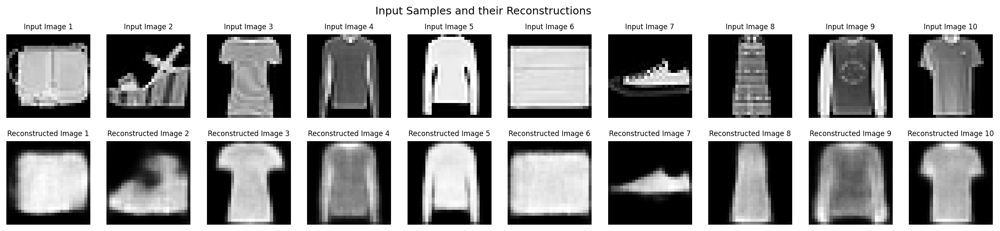

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


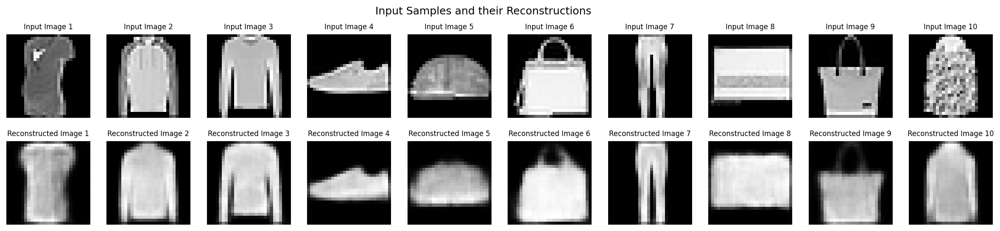

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


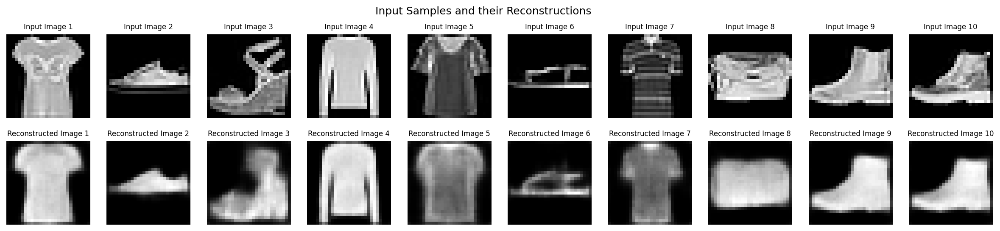

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


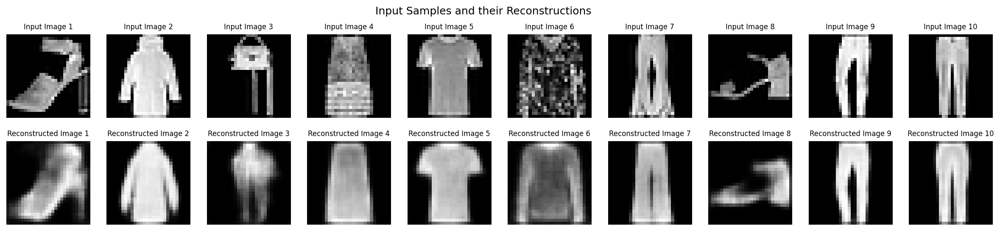

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


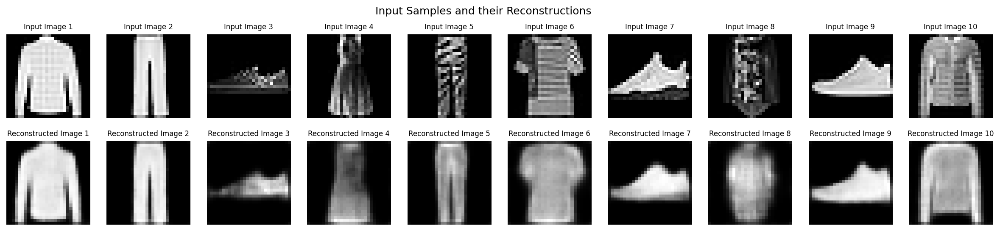

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 4/10, Loss: 0.0602
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch

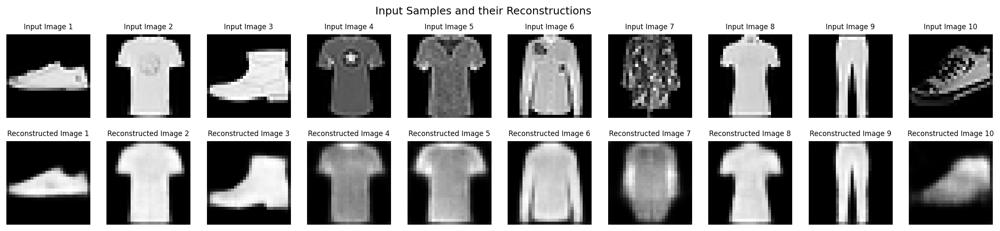

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


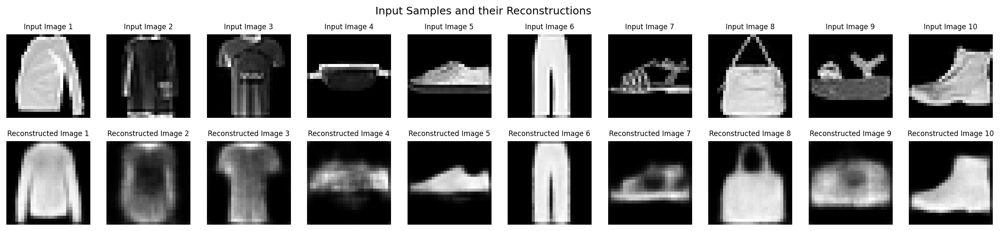

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


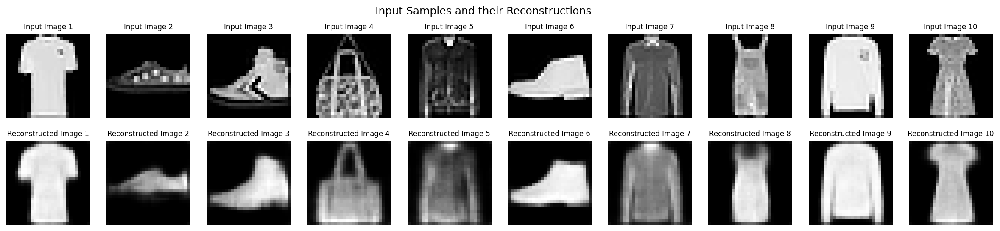

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


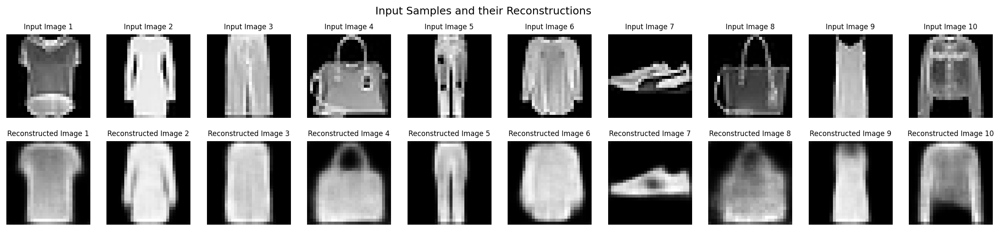

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


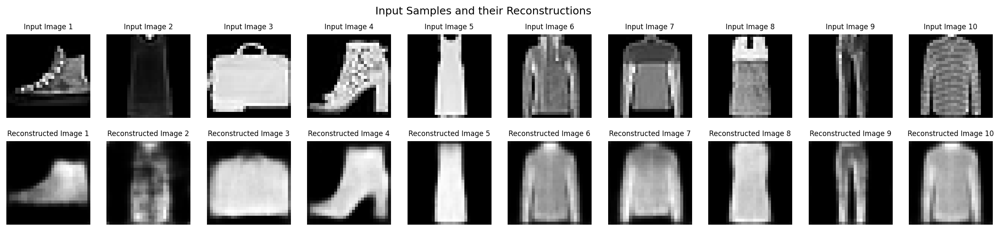

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


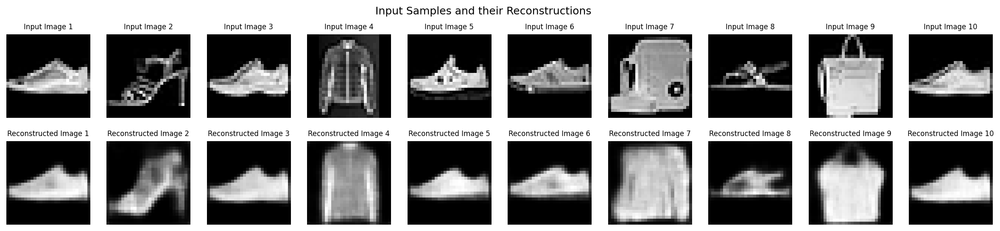

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


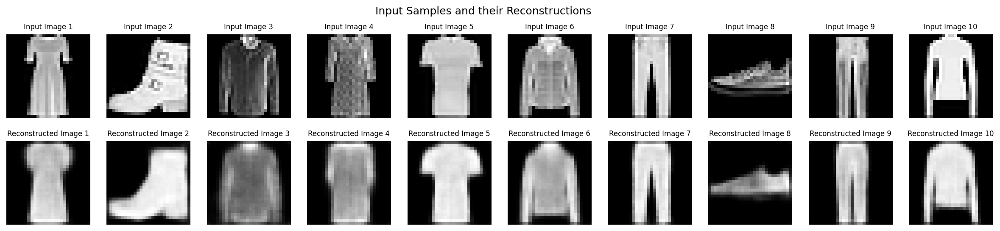

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 5/10, Loss: 0.0603
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch

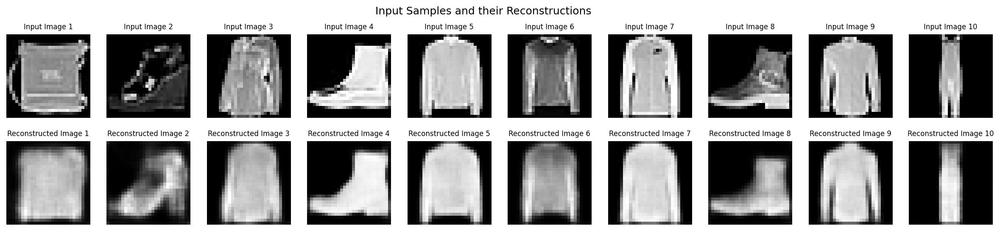

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


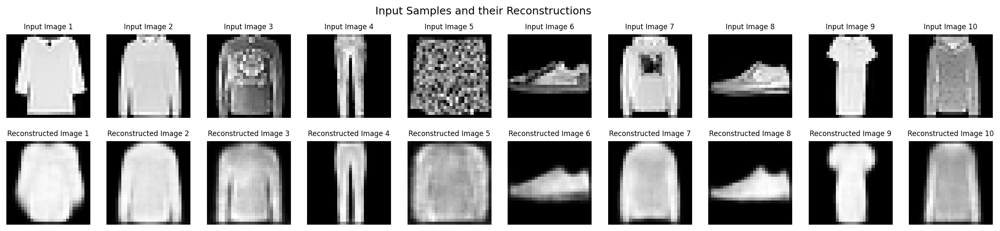

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


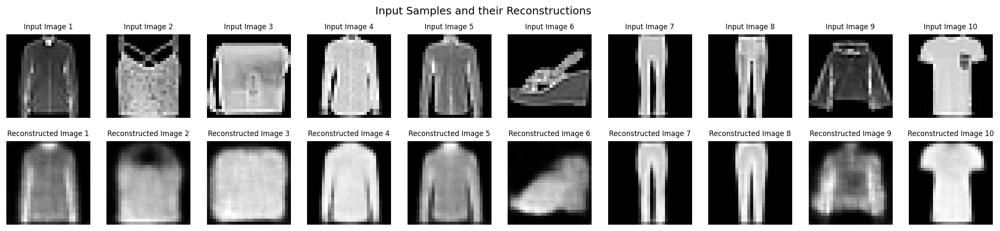

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


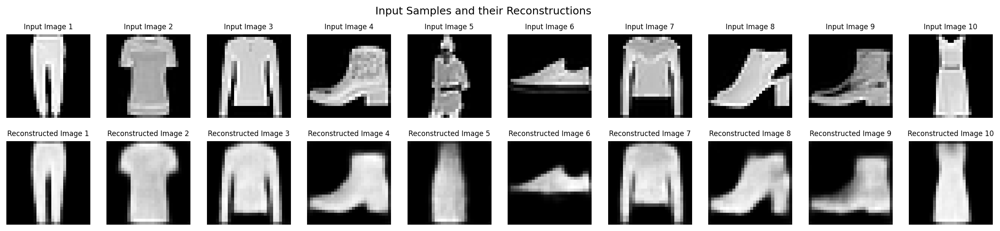

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


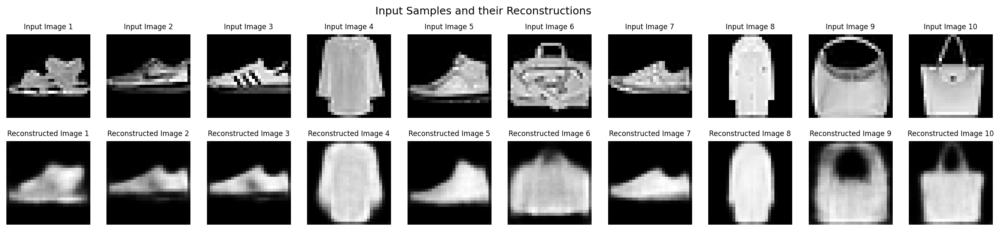

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


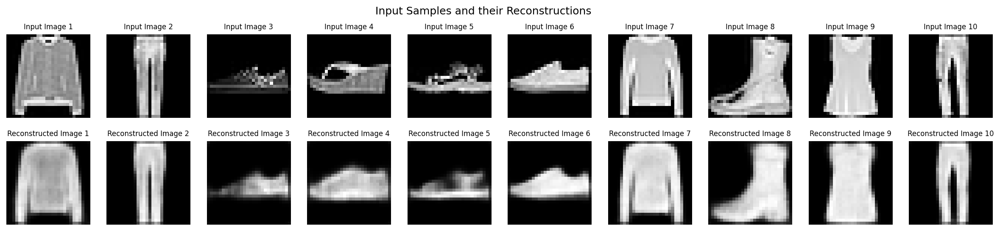

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


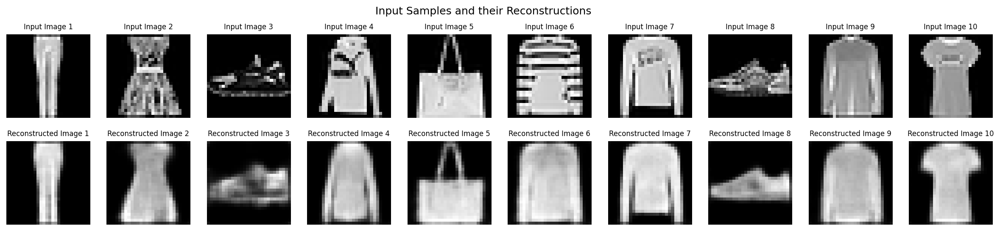

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 6/10, Loss: 0.0603
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch

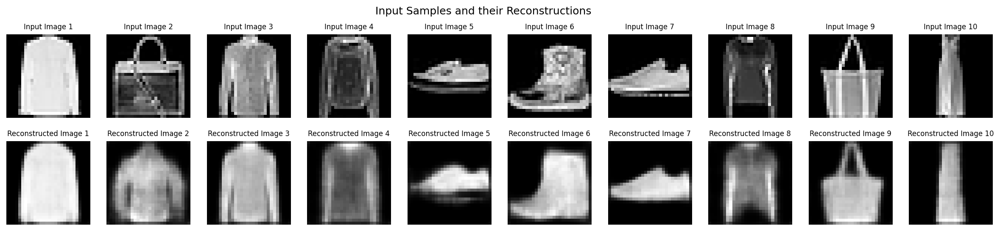

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


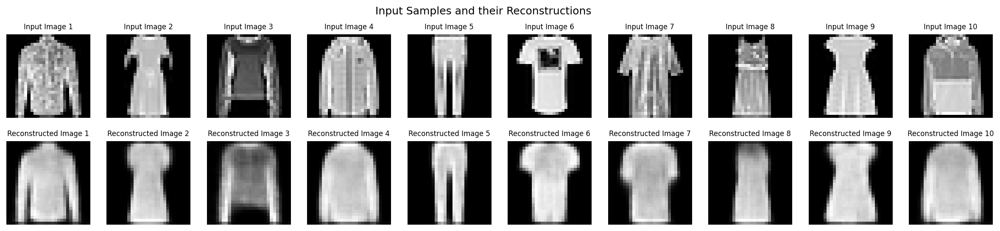

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


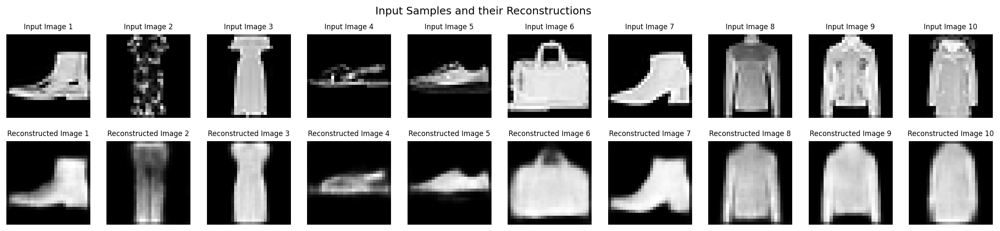

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


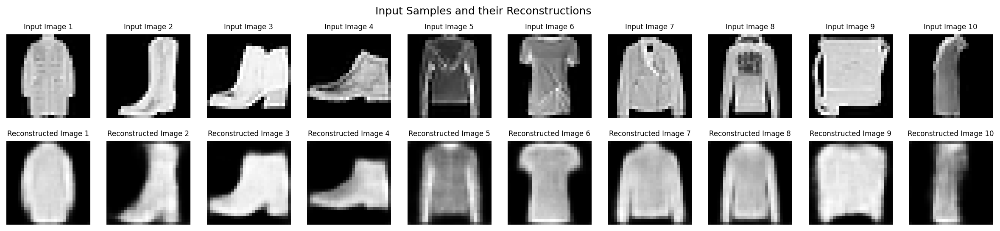

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


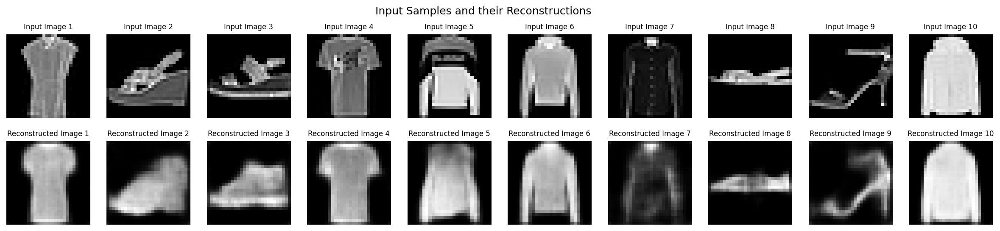

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


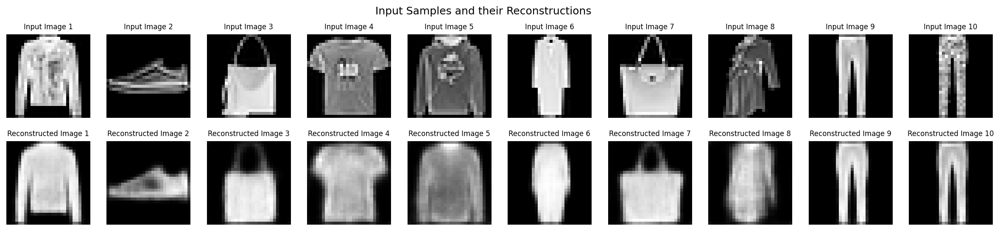

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


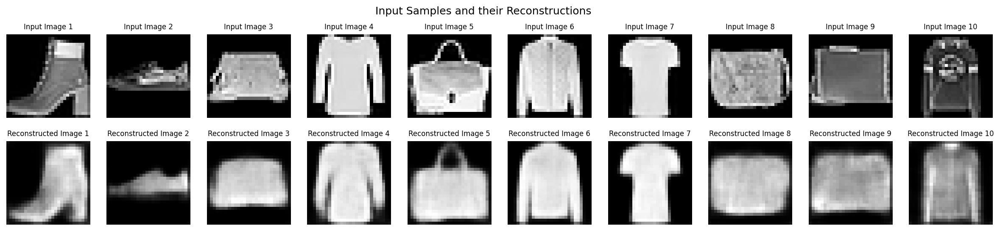

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 7/10, Loss: 0.0603
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch

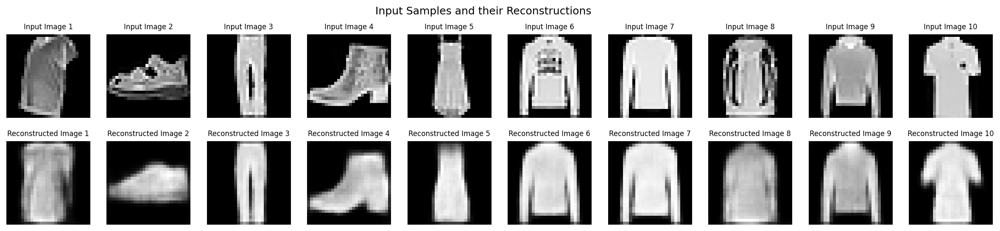

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


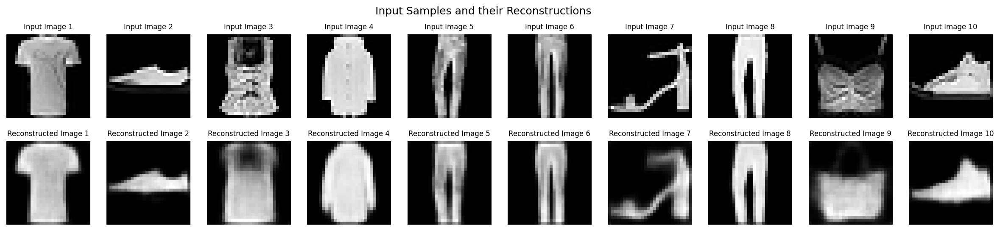

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


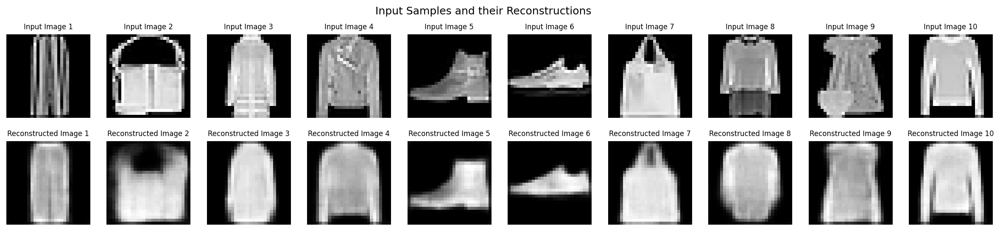

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


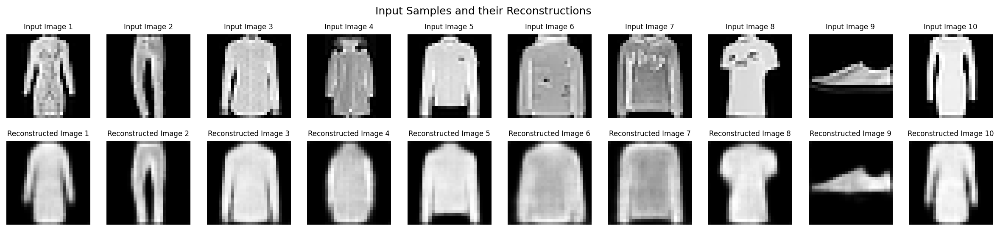

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


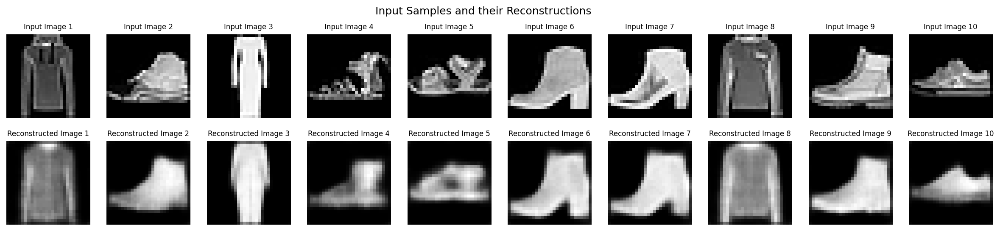

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


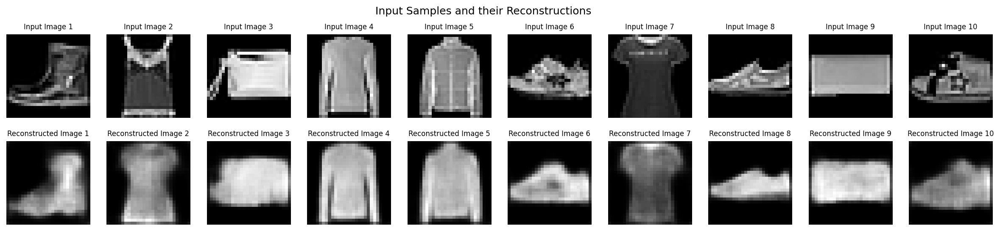

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


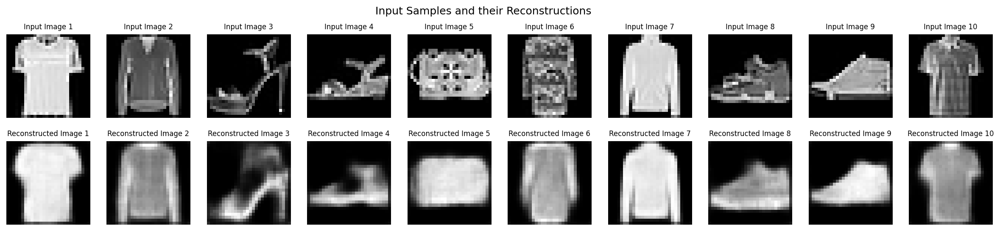

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 8/10, Loss: 0.0603
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch

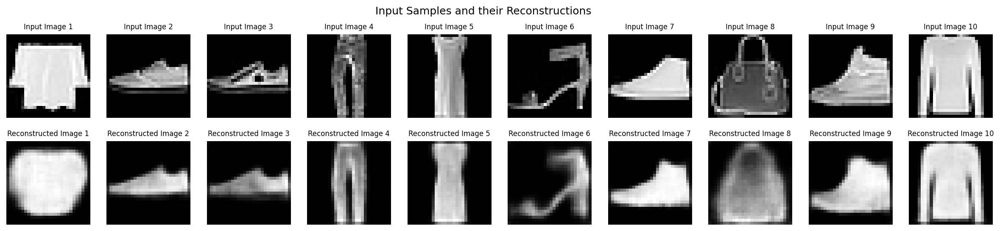

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


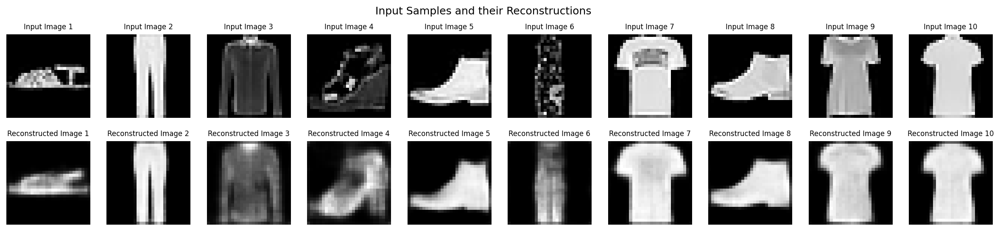

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


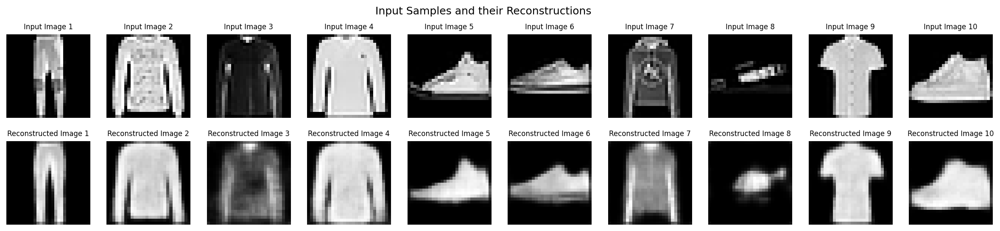

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


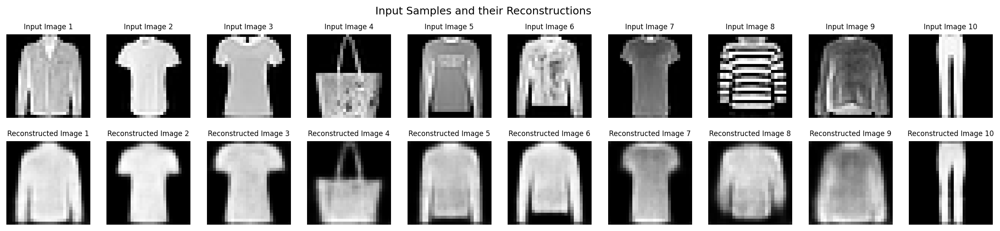

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


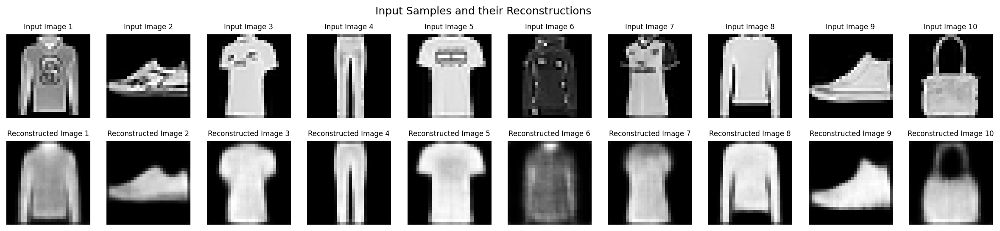

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


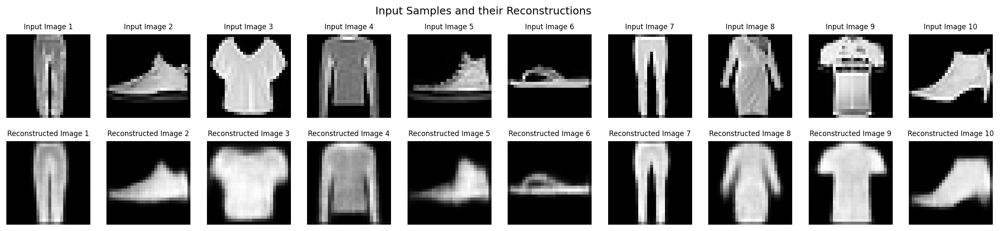

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


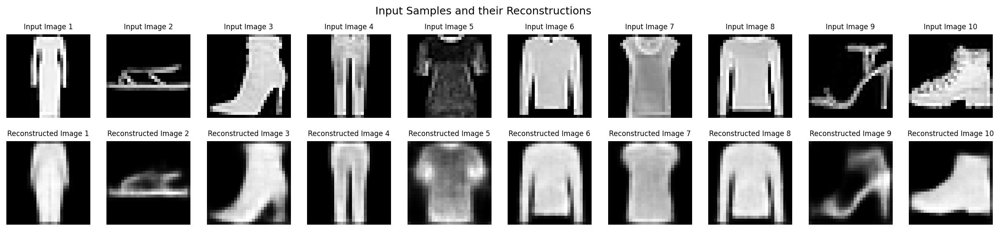

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 9/10, Loss: 0.0606
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch

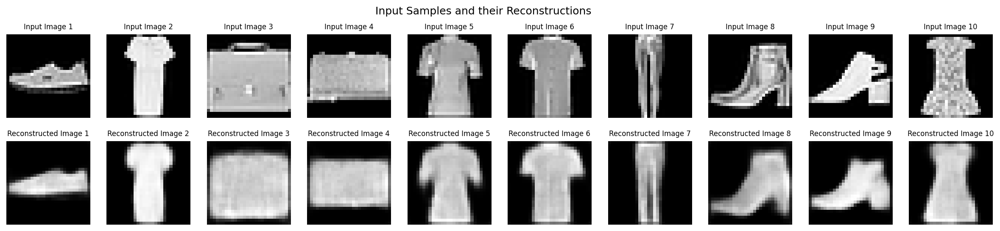

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


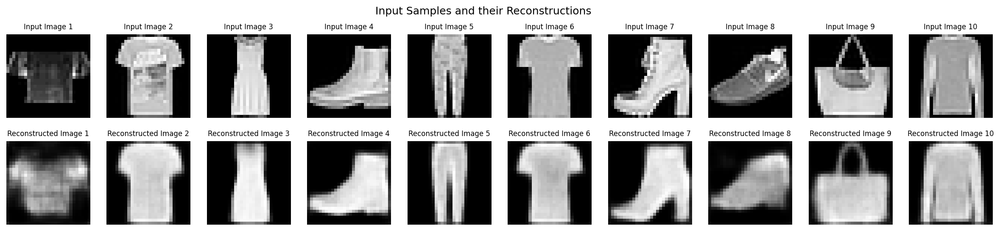

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


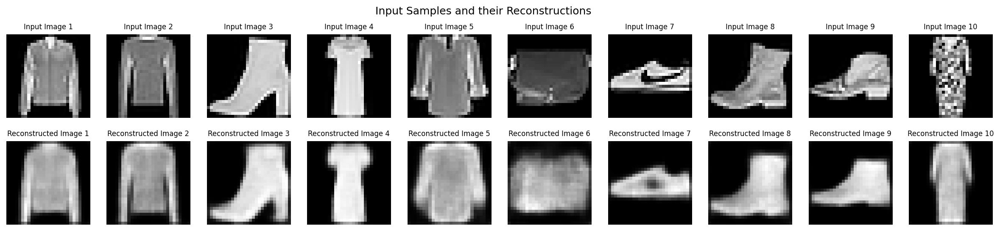

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


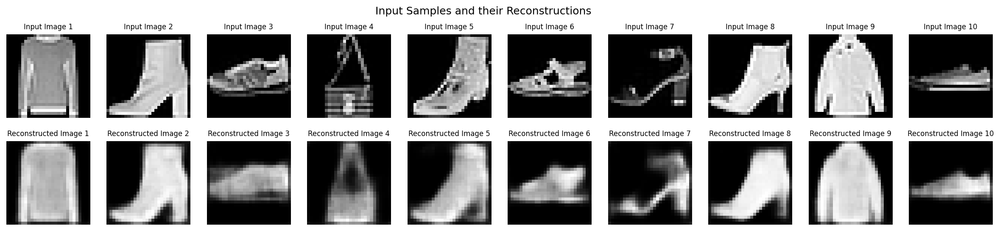

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


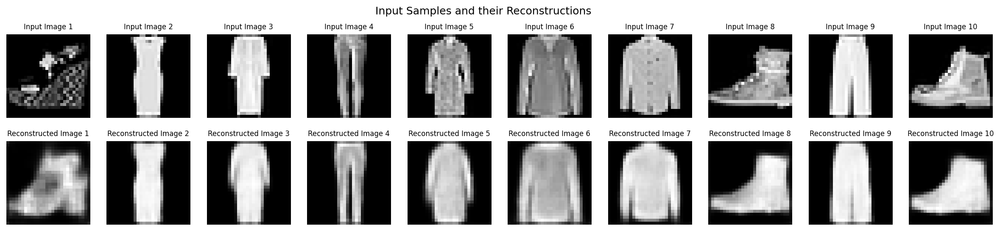

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


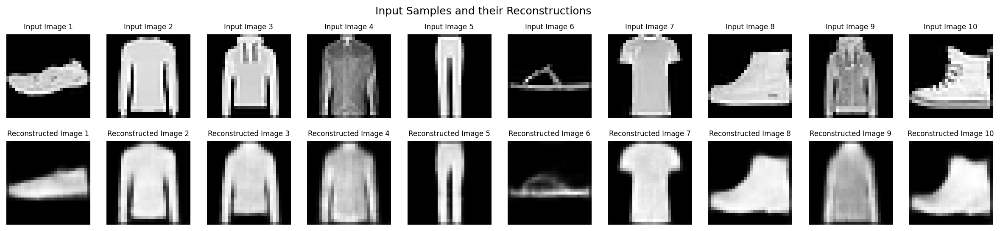

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])


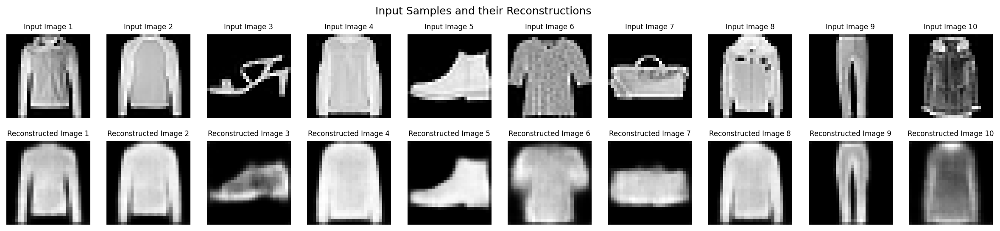

Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([128, 10])
Decoder Shape of x: torch.Size([128, 1, 28, 28])
Encoder Shape of x: torch.Size([16, 10])
Decoder Shape of x: torch.Size([16, 1, 28, 28])
Epoch 10/10, Loss: 0.0604


In [23]:
# 3.4 During the computation of the testing loss plot ten input samples as well as their reconstructions produced by the autoencoder
# test the model
for epoch in range(epochs):
    test_loss = test(conv_autoencoder, testloader, criterion, device=device)
    test_losses.append(test_loss)
    print(f'Epoch {epoch+1}/{epochs}, Loss: {test_loss:.4f}')

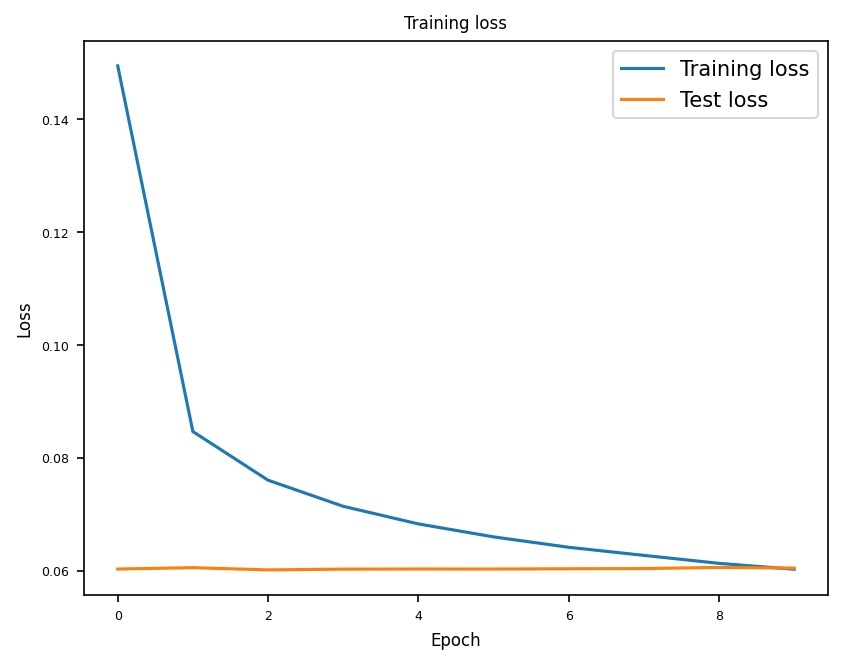

In [24]:
# Plot the loss curve
plot_loss(train_losses, test_losses, label='Training loss', path=RESULTS_DIR+'conv_ae_loss_curve.png')

**3.5 Compare the performance of this model to the model from the prior task**

TODO